In [1]:
# Import
import os
import pandas as pd
import numpy as np

from pathlib import Path

from CellPacking.tissuegeneration import sheet_init, symetric_circular
from CellPacking.dynamics import (Compression, 
                                  AnisotropicLineTension, 
                                  ShearPlanarGeometry, 
                                  PlaneBarrierElasticity)

from tyssue import Sheet
from tyssue import PlanarGeometry
from tyssue.solvers import QSSolver
from tyssue.solvers.viscous import EulerSolver
from tyssue.behaviors.event_manager import EventManager
from tyssue.behaviors.sheet.basic_events import reconnect, reconnect_3D
from tyssue.dynamics import model_factory, effectors
from tyssue.core.history import HistoryHdf5 


import matplotlib.pyplot as plt
from tyssue.draw import sheet_view
from CellPacking.plot import superimpose_sheet_view
from CellPacking.plot import sheet_view as ply_sheet_view

from tyssue.generation import extrude 
from tyssue import Monolayer
from CellPacking.dynamics import ShearMonolayerGeometry
from tyssue.io.hdf5 import save_datasets

from tyssue.io.hdf5 import load_datasets
from tyssue.io.meshes import save_triangular_mesh

CGAL-based mesh generation utilities not found, you may need to install CGAL and build from source
C++ extensions are not available for this version
collision solver could not be imported You may need to install CGAL and re-install tyssue


In [2]:
SIM_DIR = Path('/mnt/sda1/Sophie/1-CellPacking/0-Simulations-to-sort/20250320_3D_QS_without_HI_PerimeterImpactVolume_lateralfixe_3_5_G001')
sim_save_dir = SIM_DIR
try:
    os.mkdir(sim_save_dir)
except FileExistsError:
    pass

In [3]:
%pdb

Automatic pdb calling has been turned ON


# Apical sheet init

In [4]:
def tissue_init(phi, noise):
    
    apical_sheet, border = symetric_circular(10, -100, phi, 0,  noise=noise)

    apical_sheet.face_df['prefered_perimeter'] = 3 * np.sqrt(apical_sheet.face_df['prefered_area'])

    ## apical surface at the equilibrium
    # Solver
    solver_qs = QSSolver(with_t1=False, with_t3=False, with_collisions=False)

    manager = EventManager()
    manager.append(reconnect)
    # Model
    model = model_factory(
        [
            effectors.FaceAreaElasticity,
            effectors.PerimeterElasticity, 
        ])
    for i in range(50):
        manager.execute(apical_sheet)
        res = solver_qs.find_energy_min(apical_sheet, PlanarGeometry, model, periodic=False, options={"gtol": 1e-8})
        if res.success is False:
            print (i, res.success)
        apical_sheet.vert_df[["x", "y"]] += np.random.normal(scale=1e-3, size=(apical_sheet.Nv, 2))
        PlanarGeometry.update_all(apical_sheet)
        manager.update()


    ## Monolayer creation
    apical_sheet.face_df['z'] = 1
    apical_sheet.edge_df['z'] = 1
    apical_sheet.vert_df['z'] = 1

    extruded = extrude(apical_sheet.datasets, method='translation', vector=[0, 0, -2])
    monolayer = Monolayer('mono', extruded)

    monolayer.sanitize(trim_borders=True, order_edges=True)
    monolayer.validate()


    monolayer.face_df['prefered_area'] = monolayer.face_df.loc[0,'prefered_area']
    monolayer.face_df['prefered_perimeter'] = 3*np.sqrt(monolayer.face_df['prefered_area'])
    monolayer.face_df['area_elasticity'] = 1
    monolayer.face_df['perimeter_elasticity'] = 0.5


    

    monolayer.vert_df['barrier_elasticity'] = 280
    monolayer.vert_df['z_barrier'] = 0.6

    monolayer.update_specs({"settings":{"dt":0.01,
                                         'threshold_length': 0.1,
                                         'p_4': 1,
                                         'p_5p': 1,
                                          "nrj_norm_factor": 1.0, 
                                       'multiplier':3, },
                          "cell": {
                                    "x": 0.0,
                                    "y": 0.0,
                                    "z": 0.0,
                                    "is_alive": True,
                                    "prefered_volume": 0.7,
                                    "volume": 0.7,
                                    "volume_elasticity": 0.5,
                                    "z_barrier":1.1,
                                    },
                          "edge": {
                                    "dx": 0.0,
                                    "srce": 0,
                                    "face": 0,
                                    "dy": 0.0,
                                    "ny": 0.0,
                                    "nx": 0.0,
                                    "length": 0.0,
                                    "nz": 0.0,
                                    "cell": 0,
                                    "sub_volume": 0.0,
                                    "dz": 0.0,
                                    "sub_area": 0.0,
                                    "trgt": 0},
                          "vert": {
                                    "x": 0.0,
                                    "is_active": True,
                                    "z": 0.0,
                                    "y": 0.0},
                          "face": {
                                    "x": 0.0,
                                    "is_alive": True,
                                    "z": 0.0,
                                    "y": 0.0,}
                        })


    ShearMonolayerGeometry.update_all(monolayer)

    monolayer.face_df['prefered_area'] = monolayer.face_df['area']
    monolayer.face_df['prefered_perimeter'] = 3*np.sqrt(monolayer.face_df['prefered_area'])

    ShearMonolayerGeometry.update_all(monolayer)

    # Manager
    manager = EventManager('face')#, track_event=False)

    monolayer.get_opposite_faces()

    monolayer.get_opposite_faces()
    edge_opp_face = monolayer.upcast_face(monolayer.face_df['opposite'])
    monolayer.edge_df['is_border']=False
    monolayer.edge_df.loc[edge_opp_face[edge_opp_face==-1].index, 'is_border']=True

    monolayer.edge_df['opposite'] = pd.to_numeric(monolayer.edge_df['opposite'])
    monolayer.edge_df['z'] = pd.to_numeric(monolayer.edge_df['z'])

    ShearMonolayerGeometry.update_all(monolayer)

    # monolayer equilibrium before apply forces 
    # Model
    model = model_factory(
        [
#                 PlaneBarrierElasticity,
    #         effectors.LineTension,
            effectors.FaceAreaElasticity,
            effectors.PerimeterElasticity,
            effectors.CellVolumeElasticity,
        ],
    )
    manager.append(reconnect_3D)
    solver_qs = QSSolver(with_t1=False, with_t3=False, with_collisions=False)

    for i in range(10):
        manager.execute(monolayer)

        res = solver_qs.find_energy_min(monolayer, ShearMonolayerGeometry, model, periodic=False, options={"gtol": 1e-8})
        if res.success is False:
            print (i, res.success)
        monolayer.vert_df[["x", "y"]] += np.random.normal(scale=1e-3, size=(monolayer.Nv, 2))
        save_triangular_mesh('monolayer0.19.vtk', monolayer)
        ShearMonolayerGeometry.update_all(monolayer)
        manager.update()


    return monolayer


def simu_process(monolayer_, r, g, ratio):
    
    monolayer=monolayer_.copy(deep_copy=True)
    sim_save_dir = SIM_DIR/str(r)
    try:
        os.mkdir(sim_save_dir)
    except FileExistsError:
        pass
    
    try:
        os.mkdir(sim_save_dir/str(ratio))
    except FileExistsError:
        pass

    gamma_0 = g
    monolayer.update_specs({"edge": {"gamma_0": g}})
    monolayer.edge_df['gamma_0'] = pd.to_numeric(monolayer.edge_df['gamma_0'])
    monolayer.edge_df['gamma_0'] = monolayer.edge_df['gamma_0'].replace(-100, g)
    monolayer.face_df['prefered_perimeter'] = ratio*np.sqrt(monolayer.face_df['prefered_area'])

    lat_face = monolayer.face_df[monolayer.face_df["segment"]=="lateral"].index
    monolayer.face_df.loc[lat_face, 'prefered_perimeter'] = 3.5*np.sqrt(monolayer.face_df.loc[lat_face, 'prefered_area'])
    
    monolayer.specs['settings']['file_text'] = os.path.join(sim_save_dir/str(ratio),'output_t1.txt')
    
    # Apply ratio -> prefered perimeter change
    model = model_factory(
        [
#                 PlaneBarrierElasticity,
#             effectors.LineTension,
            effectors.FaceAreaElasticity,
            effectors.PerimeterElasticity,
                effectors.CellVolumeElasticity,
        ],
    )

    solver_qs = QSSolver(with_t1=False, with_t3=False, with_collisions=False)
    # Manager
    manager = EventManager('face')#, track_event=False)
    manager.append(reconnect_3D)

    for i in range(100):
        print('------------TEMPS------------')
        print(i)
        manager.execute(monolayer)
        lat_face = monolayer.face_df[monolayer.face_df["segment"]=="lateral"].index
        monolayer.face_df.loc[lat_face, 'prefered_perimeter'] = 3.5*np.sqrt(monolayer.face_df.loc[lat_face, 'prefered_area'])
        res = solver_qs.find_energy_min(monolayer, ShearMonolayerGeometry, model, periodic=False, options={"gtol": 1e-8})
        if res.success is False:
            print (i, res.success)

        monolayer.vert_df[["x", "y"]] += np.random.normal(scale=1e-3, size=(monolayer.Nv, 2))
        manager.update()
        save_datasets(os.path.join(sim_save_dir/str(ratio),'monolayer'+str(i)+'.hf5'), monolayer)
    
    
    ## Apply forces
    # Model

    model = model_factory(
        [
#                 PlaneBarrierElasticity,
            effectors.LineTension,
            effectors.FaceAreaElasticity,
            effectors.PerimeterElasticity,
                effectors.CellVolumeElasticity,
        ],
    )

    solver_qs = QSSolver(with_t1=False, with_t3=False, with_collisions=False)
    # Manager
    manager = EventManager('face')#, track_event=False)
    manager.append(reconnect_3D)

    for i in range(200):
        i=i+100
        print('------------TEMPS------------')
        print(i)
        manager.execute(monolayer)
        lat_face = monolayer.face_df[monolayer.face_df["segment"]=="lateral"].index
        monolayer.face_df.loc[lat_face, 'prefered_perimeter'] = 3.5*np.sqrt(monolayer.face_df.loc[lat_face, 'prefered_area'])
        res = solver_qs.find_energy_min(monolayer, ShearMonolayerGeometry, model, periodic=False, options={"gtol": 1e-8})
        if res.success is False:
            print (i, res.success)

        monolayer.vert_df[["x", "y"]] += np.random.normal(scale=1e-3, size=(monolayer.Nv, 2))
        manager.update()
        save_datasets(os.path.join(sim_save_dir/str(ratio),'monolayer'+str(i)+'.hf5'), monolayer)


In [5]:
from joblib import Parallel, delayed
import multiprocessing
from datetime import datetime


global_start=datetime.now()
print ("start : " + str(global_start))
num_cores = multiprocessing.cpu_count()


repeat = np.arange(0, 15)

gammas = 0.01
ratios = np.arange(2, 4.2, 0.2)



# Number of cells in x and y axis
nx = 40
ny = 40
noise = 0.3
phi = np.pi/2

for r in repeat:
    monolayer = tissue_init(phi, noise)
    
#     for ratio in ratios :
#         try:
#             simu_process(monolayer, r, gammas, round(ratio, 1))
#         except:
#             pass
        
    results = Parallel(n_jobs=12)(delayed(simu_process)(
        monolayer, r, gammas,round(ratio,1)) for ratio in ratios)

# simu_process(repeat[0][0], gammas[0][0], phi, noise)
global_end = datetime.now()
print ("end : " + str(global_end))
print ('Duree totale d execution : \n\t\t')
print (global_end-global_start)

start : 2025-04-06 16:31:33.249522
get_opposite_faces
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
1347   368   368   107
1348   368   368    87
dropped_two_faces
get_opposite_faces
merge_vertices
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
1549   565   565   184
1550   565   565   204
dropped_two_faces
get_opposite_faces
merge_vertices
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
1428   450   450   311
1429   450   450   312
dropped_two_faces
get_opposite_faces
merge_vertices
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
747     21    21   102
748     21    21   123
dropped_two_faces
get_opposite_faces
merge_vertices
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
1796   328   328   314
1797   328   328   322
dropped_two_faces
get_opposite_faces
merge_vertices
collapse_ edge_ base topol

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .

get_opposite_faces
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
1575   576   576    78
1576   576   576    60
dropped_two_faces
get_opposite_faces
merge_vertices


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .

get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
1721   611   611   317
1722   611   611   318
dropped_two_faces
get_opposite_faces
merge_vertices
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
1723   612   612   305
1724   612   612   317
dropped_two_faces
get_opposite_faces
merge_vertices
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
1205   408   408   104
1206   408   408    83
dropped_two_faces
get_opposite_faces
merge_vertices


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .

4 False
get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
195    148   148   213
196    148   148   231
dropped_two_faces
get_opposite_faces
merge_vertices
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
778    303   303   273
779    303   303   290
dropped_two_faces
get_opposite_faces
merge_vertices


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .

14 False
get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
978    411   411    98
979    411   411   118
dropped_two_faces
get_opposite_faces
merge_vertices


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .

get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
1705   322   322   313
1706   322   322   314
dropped_two_faces
get_opposite_faces
merge_vertices
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
1149   449   449    69
1150   449   449    67
dropped_two_faces
get_opposite_faces
merge_vertices


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .

get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
1302   363   363   224
1303   363   363   222
dropped_two_faces
get_opposite_faces
merge_vertices


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .

get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces
split_vertices
split vertex
363 242
630
      trgt        nz    length  face  srce        dx        dy        sx  \
edge                                                                       
1286   486  0.223381  0.468188   224   485 -0.447190 -0.138639  6.011568   
1287   485  0.250270  0.468188   243   486  0.447190  0.138639  5.564378   
1288   487  0.295157  0.876803   242   486 -0.436799  0.760256  5.564378   
1289   486  0.292656  0.876803   243   487  0.436799 -0.760256  5.127579   
1300   486  0.210803  0.385913   242   363  0.213995  0.321147  5.350384   
1301   363  0.223752  0.385913   224   486 -0.213995 -0.321147  5.564378   
1459   544  0.349657  0.681110   222   363 -0.659849  0.168849  5.350384   
1460   363  0.304126  0.681110   242   544  0.659849 -0.168849  4.690534   
1461   544  0.181277  0.408696   242   543  0.104382 -0.395142  4.586153   
1462   543  0.199856  0.408696   241   544 -0.104382  0.395142  4.690534   
1739   610  0.203874  0.52478

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))


get_opposite_faces
collapse_ edge_ base topology
collapsed
      srce  trgt  face
edge                  
1841   363   363   224
1842   363   363   222
dropped_two_faces
get_opposite_faces
merge_vertices


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .

get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/core/objects.py:875: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  .apply(lambda df: dict(enumerate(df)))
/tmp/ipykernel_2047463/3033162891.py:38: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  monolayer.validate()


get_opposite_faces
get_opposite_faces
get_opposite_faces
twist_face


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)


get_opposite_faces
get_opposite_faces
twist_face


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)


get_opposite_faces
get_opposite_faces
twist_face


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)


get_opposite_faces
get_opposite_faces
twist_face


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)


get_opposite_faces
get_opposite_faces
twist_face


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces


Edge 2241 is not a valid junction to perform IH transition, aborting


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)


get_opposite_faces
get_opposite_faces
twist_face


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)


get_opposite_faces
get_opposite_faces
twist_face


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)


get_opposite_faces
get_opposite_faces
twist_face


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)


get_opposite_faces
get_opposite_faces
twist_face


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)


get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

collision solver could not be imported You may need to install CGAL and re-install tyssue
------------TEMPS------------
0
------------TEMPS------------
1
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
1 False
------------TEMPS------------
2
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
3
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
3 False
------------TEMPS------------
4
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
5
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
6
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_fa

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is

collision solver could not be imported You may need to install CGAL and re-install tyssue
------------TEMPS------------
0
------------TEMPS------------
1
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
1 False
------------TEMPS------------
2
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
3
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
4
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
4 False
------------TEMPS------------
5
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
6
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is

collision solver could not be imported You may need to install CGAL and re-install tyssue
------------TEMPS------------
0
------------TEMPS------------
1
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
1 False
------------TEMPS------------
2
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
3
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
4
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
4 False
------------TEMPS------------
5
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
5 False
------------TEMPS------------
6
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
-------

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

collision solver could not be imported You may need to install CGAL and re-install tyssue
------------TEMPS------------
0
------------TEMPS------------
1
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
1 False
------------TEMPS------------
2
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
3
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
3 False
------------TEMPS------------
4
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
5
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
5 False
------------TEMPS------------
6
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_op

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype=

collision solver could not be imported You may need to install CGAL and re-install tyssue
------------TEMPS------------
0
------------TEMPS------------
1
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
2
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
2 False
------------TEMPS------------
3
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
4
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
4 False
------------TEMPS------------
5
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
6
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
6 Fa

Edge 7658 has adjacent triangular faces can't perform IH transition, aborting
Edge 7658 is not a valid junction to perform IH transition, aborting
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignor

collision solver could not be imported You may need to install CGAL and re-install tyssue
------------TEMPS------------
0
------------TEMPS------------
1
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
1 False
------------TEMPS------------
2
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
2 False
------------TEMPS------------
3
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
4
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
4 False
------------TEMPS------------
5
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
6
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
6 False
------------TEMPS-

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: T

collision solver could not be imported You may need to install CGAL and re-install tyssue
------------TEMPS------------
0
------------TEMPS------------
1
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
1 False
------------TEMPS------------
2
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
3
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
3 False
------------TEMPS------------
4
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
5
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
5 False
------------TEMPS------------
6
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS---------


            Topology cannot be correctly determined around edge 10951
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site

collision solver could not be imported You may need to install CGAL and re-install tyssue
------------TEMPS------------
0
------------TEMPS------------
1
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
1 False
------------TEMPS------------
2
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
3
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
3 False
------------TEMPS------------
4
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
5
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
6
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
7
ge

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

collision solver could not be imported You may need to install CGAL and re-install tyssue
------------TEMPS------------
0
------------TEMPS------------
1
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
1 False
------------TEMPS------------
2
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
3
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
3 False
------------TEMPS------------
4
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
4 False
------------TEMPS------------
5
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
6
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_fa

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.vert_df = eptm.vert_df.loc[set(eptm.edge_df.sort_values("srce")["srce"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:527: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.face_df = eptm.face_df.loc[set(eptm.edge_df.sort_values("face")["face"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:528: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.cell_df = eptm.cell_df.loc[set(eptm.edge_df.sort_values("cell")["cell"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will 

collision solver could not be imported You may need to install CGAL and re-install tyssue
------------TEMPS------------
0
------------TEMPS------------
1
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
1 False
------------TEMPS------------
2
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
3
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
3 False
------------TEMPS------------
4
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
5
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
5 False
------------TEMPS------------
6
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS---------

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

collision solver could not be imported You may need to install CGAL and re-install tyssue
------------TEMPS------------
0
------------TEMPS------------
1
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
1 False
------------TEMPS------------
2
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
2 False
------------TEMPS------------
3
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
4
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
4 False
------------TEMPS------------
5
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
6
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
6 False
------------TEMPS-

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.vert_df = eptm.vert_df.loc[set(eptm.edge_df.sort_values("srce")["srce"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:527: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.face_df = eptm.face_df.loc[set(eptm.edge_df.sort_values("face")["face"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:528: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.cell_df = eptm.cell_df.loc[set(eptm.edge_df.sort_values("cell")["cell"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will 

Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
53 False
------------TEMPS------------
54
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
54 False
------------TEMPS------------
55
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
56
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
56 False
------------TEMPS------------
57
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
58
get_opposite_faces
twist_face
get_opposite_faces
get_opposit

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)

            Topology cannot be correctly determined around edge 10515
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site

get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
53 False
------------TEMPS------------
54
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
54 False
------------TEMPS------------
55
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
56
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
57
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
57 False
------------TEMPS------------
58
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_f

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.vert_df = eptm.vert_df.loc[set(eptm.edge_df.sort_values("srce")["srce"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:527: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.face_df = eptm.face_df.loc[set(eptm.edge_df.sort_values("face")["face"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:528: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.cell_df = eptm.cell_df.loc[set(eptm.edge_df.sort_values("cell")["cell"])]

            Topology cannot be correctly determined around edge 10744
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyss

get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
54 False
------------TEMPS------------
55
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
56
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
56 False
------------TEMPS------------
57
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
58
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
58 False
------------TEMPS------------
59
get_opposite_faces
twist_face
get_opposite_faces
get_opposite

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.vert_df = eptm.vert_df.loc[set(eptm.edge_df.sort_values("srce")["srce"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:527: FutureWarning: Passing a set as an inde

get_opposite_faces
get_opposite_faces
get_opposite_faces
54 False
------------TEMPS------------
55
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
56
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
56 False
------------TEMPS------------
57
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
58
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
58 False
------------TEMPS------------
59
get_opposite_faces
twist_face
get_opposite_faces

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/pytho

twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
55
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
55 False
------------TEMPS------------
56
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
57
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
57 False
------------TEMPS------------
58
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
59
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
59 False
------------TEMPS------------
60
get_opposite_faces
twist_face
get_opposite_faces
ge

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.vert_df = eptm.vert_df.loc[set(eptm.edge_df.sort_values("srce")["srce"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:527: FutureWarning: Passing a set as an inde

get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
54 False
------------TEMPS------------
55
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
55 False
------------TEMPS------------
56
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
57
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
57 False
------------TEMPS------------
58
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
59
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
59 False
------------TEMPS------------
60
get_opposi

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

------------TEMPS------------
55
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
55 False
------------TEMPS------------
56
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
57
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
57 False
------------TEMPS------------
58
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
59
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
59 False
------------TEMPS------------
60
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_oppos


            Topology cannot be correctly determined around edge 10413
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df

get_opposite_faces
get_opposite_faces
54 False
------------TEMPS------------
55
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
55 False
------------TEMPS------------
56
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
57
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
58
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
58 False
------------TEMPS------------
59
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
60
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
60 False
------------TEMPS------

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.vert_df = eptm.vert_df.loc[set(eptm.edge_df.sort_values("srce")["srce"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:527: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.face_df = eptm.face_df.loc[set(eptm.edge_df.sort_values("face")["face"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:528: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.cell_df = eptm.cell_df.loc[set(eptm.edge_df.sort_values("cell")["cell"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecat

twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
56
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
56 False
------------TEMPS------------
57
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
58
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
58 False
------------TEMPS------------
59
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
60
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
60 False
------------TEMPS------------
61
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
62
get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.vert_df = eptm.vert_df.loc[set(eptm.edge_df.sort_values("srce")["srce"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:527: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.face_df = eptm.face_df.loc[set(eptm.edge_df.sort_values("face")["face"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:528: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.cell_df = eptm.cell_df.loc[set(eptm.edge_df.sort_values("cell")["cell"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecat

twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
56 False
------------TEMPS------------
57
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
58
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
58 False
------------TEMPS------------
59
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
60
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
60 False
------------TEMPS------------
61
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
62
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
62 False
------------TEMPS-------

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
------------TEMPS------------
56
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
56 False
------------TEMPS------------
57
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
57 False
------------TEMPS------------
58
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
59
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
59 False
------------TEMPS------------
60
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
61
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
61 False
------------TEMPS------------
62
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, 

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The fr

get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
94
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
95
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
95 False
------------TEMPS------------
96
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
97
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposi

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
94 False
------------TEMPS------------
95
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
96
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
97
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
97 False
------------TEMPS------------
98
get_opposite_faces
twist_face
get_opposite_faces
twist_fac

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
92
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
92 False
------------TEMPS------------
93
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
94
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
94 False
------------TEMPS------------
95
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opp


            Topology cannot be correctly determined around edge 1614
            

            Topology cannot be correctly determined around edge 10780
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.

Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
98
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
98 False
------------TEMPS------------
99
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
99 False
------------TEMPS------------
100
------------TEMPS------------
101
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
101 False
------------TEMPS------------
102
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS----


            Topology cannot be correctly determined around edge 11585
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))

            Topology cannot be correctly determined around edge 10433
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/ty

get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
98 False
------------TEMPS------------
99
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
100
------------TEMPS------------
101
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
101 False
------------TEMPS------------
102
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
103
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
103 False
------------TEMPS------------
104
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_f

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The fr

------------TEMPS------------
96
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
96 False
------------TEMPS------------
97
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
98
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
98 False
------------TEMPS------------
99
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
100
100 False
------------TEMPS------------
101
get_opposite_faces
twist_face

Edge 5228 is not a valid junction to perform IH transition, aborting
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site

------------TEMPS------------
103
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
104
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
104 False
------------TEMPS------------
105
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
106
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
106 False
------------TEMPS------------
107
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
108
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
------------TEMPS------------
106
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
107
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
107 False
------------TEMPS------------
108
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
109
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
110
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Inva


            Topology cannot be correctly determined around edge 5924
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-

------------TEMPS------------
132
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
133
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
134
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
135
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
136
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
Edge 9820 is not a valid junction to perform IH transition, aborting
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site

get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
104
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
104 False
------------TEMPS------------
105
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
106
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
106 False
------------TEMPS------------
107
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
108
get_opposite_fac


            Topology cannot be correctly determined around edge 10793
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df

get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
108
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
108 False
------------TEMPS------------
109
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
110
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
110 False
------------TEMPS------------
111
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
112
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
112 False
------------TEMPS------------
113
get_opposite

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049

get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
136
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
136 False
------------TEMPS------------
137
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
138
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
138 False
------------TEMPS------------
139
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
140
get_oppos

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.vert_df = eptm.vert_df.loc[set(eptm.edge_df.sort_values("srce")["srce"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:527: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.face_df = eptm.face_df.loc[set(eptm.edge_df.sort_values("face")["face"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:528: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.cell_df = eptm.cell_df.loc[set(eptm.edge_df.sort_values("cell")["cell"])]
Edge 2027 is not a valid junction to perform IH transition, aborting
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bul

get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
129 False
------------TEMPS------------
130
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
130 False
------------TEMPS------------
131
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
132
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get

Edge 2030 is not a valid junction to perform IH transition, aborting
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df

get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
140 False
------------TEMPS------------
141
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
142
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
142 False
------------TEMPS------------
143
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
144
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
144 False
------------TEMPS------------
145
get_

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/pytho

get_opposite_faces
get_opposite_faces
get_opposite_faces
131 False
------------TEMPS------------
132
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
133
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
133 False
------------TEMPS------------
134
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
135
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
135 False
------------TEMPS------------
136
get_opposite_faces
twist_face



            Topology cannot be correctly determined around edge 10050
            
Edge 12261 has adjacent triangular faces can't perform IH transition, aborting
Edge 12261 is not a valid junction to perform IH transition, aborting

            Topology cannot be correctly determined around edge 4603
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
Edge 10197 has adjacent triangular faces can't perform IH transition, aborting
Edge 10197 is not a valid junction to perform IH transition, aborting

            Topology cannot be correctly determined around edge 10050
            

            Topology cannot be correctly determined around edg

get_opposite_faces
137 False
------------TEMPS------------
138
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
139
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
139 False
------------TEMPS------------
140
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
141
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
141 False
------------TEMPS------------
142
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, resto

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain'

get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
145 False
------------TEMPS------------
146
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
147
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
147 False
------------TEMPS------------
148
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
149
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
149 False
------------TEMPS------------
150
get_opposite_faces
twist_face
get_op

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
Edge 2042 is not a valid junction to perform IH transition, aborting
Edge 2042 is not a valid junction to perform IH transition, aborting
Edge 12173 has adjacent triangular faces can't perform IH transition, aborting
Edge 12173 is not a valid junction to perform IH transition, aborting
/home/u2175049/a

get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
147 False
------------TEMPS------------
148
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
149
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
150
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
150 False
------------TEMPS------------
151
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
152
get_opposite_faces
twist

Edge 11319 has adjacent triangular faces can't perform IH transition, aborting
Edge 11319 is not a valid junction to perform IH transition, aborting
Edge 10165 has adjacent triangular faces can't perform IH transition, aborting
Edge 10165 is not a valid junction to perform IH transition, aborting
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))

            Topology cannot be correctly determined around edge 10757
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ept

get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
145 False
------------TEMPS------------
146
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
147
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
147 False
------------TEMPS------------
148
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
149
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opp

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))

            Topology cannot be correctly determined around edge 9779
            

            Topology cannot be correctly determined around edge 10621
            

            Topology cannot be correctly determined around edge 9980
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(ep

Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
167
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
167 False
------------TEMPS------------
168
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
169
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
170
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
171
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
--------

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarnin

get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
174
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
174 False
------------TEMPS------------
175
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
176
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
176 False
------------TEMPS------------
177
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
178
get_opposite_fac

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

------------TEMPS------------
175
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
176
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
176 False
------------TEMPS------------
177
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
178
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
179
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
179 False
------------TEMPS

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.vert_df = eptm.vert_df.loc[set(eptm.edge_df.sort_values("srce")["srce"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:527: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.face_df = eptm.face_df.loc[set(eptm.edge_df.sort_values("face")["face"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:528: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.cell_df = eptm.cell_df.loc[set(eptm.edge_df.sort_values("cell")["cell"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecat

get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
165
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
165 False
------------TEMPS------------
166
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
167
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
167 False
------------TEMPS------------
168
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
169
get_opposite_faces

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is

164
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
164 False
------------TEMPS------------
165
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
166
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
166 False
------------TEMPS------------
167
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
168
get_opposite_face

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
get_opposite_faces
------------TEMPS------------
153
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
153 False
------------TEMPS------------
154
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
155
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
155 False
------------TEMPS------------
156
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
157
get_opposite_faces
twist_face
get_opposite_faces
tw

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
Edge 271 is not a valid junction to perform IH transition, aborting
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)

            Topology cannot be correctly determined around edge 10610
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from p

get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
177 False
------------TEMPS------------
178
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
179
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
180
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
180 False
------------TEMPS------------
181
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposit

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)

            Topology cannot be correctly determined around edge 9965
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-

get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
186
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
187
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
187 False
------------TEMPS------------
188
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
189
get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.vert_df = eptm.vert_df.loc[set(eptm.edge_df.sort_values("srce")["srce"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:527: FutureWarning: Passing a set as an inde

get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
210
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
210 False
------------TEMPS------------
211
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
212
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
212 False
------------TEMPS------------
213
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
get_opposite_faces
205 False
------------TEMPS------------
206
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
207
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
208
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
208 False
------------TEMPS------------
209
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
210
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
210 False
---------

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049

get_opposite_faces
------------TEMPS------------
186
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
186 False
------------TEMPS------------
187
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
188
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
189
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
189 False
------------TEMPS------------
190
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
184 False
------------TEMPS------------
185
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
186
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
186 False
------------TEMPS------------
187
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
187 False
------------TEMPS------------
188
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_fac


            Topology cannot be correctly determined around edge 11514
            
Edge 1154 is not a valid junction to perform IH transition, aborting
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)

            Topology cannot be correctly determined around edge 11193
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed 

Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
208 False
------------TEMPS------------
209
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
------------TEMPS------------
210
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
210 False
------------TEMPS------------
211
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
212
get_opposite_faces
twist_face
get_opposite_faces


            Topology cannot be correctly determined around edge 9864
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-

get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
203
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
203 False
------------TEMPS------------
204
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
205
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
205 False
------------TEMPS------------
206
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Inv

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
197 False
------------TEMPS------------
198
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
199
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
199 False
------------TEMPS------------
200
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
g

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

------------TEMPS------------
194
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
194 False
------------TEMPS------------
195
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
196
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
196 False
------------TEMPS------------
197
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
198
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
-------

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: P

Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
218
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
218 False
------------TEMPS------------
219
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
220
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
220 False
------------TEMPS------------
221
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
222
get_opposite_fac

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.vert_df = eptm.vert_df.loc[set(eptm.edge_df.sort_values("srce")["srce"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:527: FutureWarning: Passing a set as an inde

Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
215
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
215 False
------------TEMPS------------
216
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
217
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
217 False
------------TEMPS------------
218
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
219
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
219 False
--------

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)

            T

Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
248
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
249
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
249 False
------------TEMPS------------
250
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
251
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
251 False
------------TEMPS------------
252
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_oppo

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

------------TEMPS------------
246
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
247
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
247 False
------------TEMPS------------
248
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
249
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
------------TEMPS------------
250
get_o

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
226
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
227
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
227 False
------------TEMPS------------
228
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
229
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
ge


            Topology cannot be correctly determined around edge 10529
            
Edge 5052 is not a valid junction to perform IH transition, aborting
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from 

get_opposite_faces
get_opposite_faces
get_opposite_faces
220 False
------------TEMPS------------
221
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
221 False
------------TEMPS------------
222
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
223
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
223 False
------------TEMPS------------
224
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.vert_df = eptm.vert_df.loc[set(eptm.edge_df.sort_values("srce")["srce"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:527: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.face_df = eptm.face_df.loc[set(eptm.edge_df.sort_values("face")["face"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:528: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.cell_df = eptm.cell_df.loc[set(eptm.edge_df.sort_values("cell")["cell"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecat

------------TEMPS------------
243
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
244
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
245
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
------------TEMPS------------
246
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_oppos


            Topology cannot be correctly determined around edge 9958
            

            Topology cannot be correctly determined around edge 10020
            

            Topology cannot be correctly determined around edge 10088
            

            Topology cannot be correctly determined around edge 9958
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:5

------------TEMPS------------
235
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
236
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
237
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
237 False
------------TEMPS------------
238
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
239
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_op

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.vert_df = eptm.vert_df.loc[set(eptm.edge_df.sort_values("srce")["srce"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:527: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.face_df = eptm.face_df.loc[set(eptm.edge_df.sort_values("face")["face"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:528: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.cell_df = eptm.cell_df.loc[set(eptm.edge_df.sort_values("cell")["cell"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecat

twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
230 False
------------TEMPS------------
231
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
232
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
233
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
234
get_opposite_faces
twist_face
get_opposite

Edge 9391 is not a valid junction to perform IH transition, aborting

            Topology cannot be correctly determined around edge 10690
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_f

------------TEMPS------------
283
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
283 False
------------TEMPS------------
284
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
285
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
285 False
------------TEMPS------------
286
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
286 False
------------TEMPS------------
287
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Inva

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain'

get_opposite_faces
get_opposite_faces
230 False
------------TEMPS------------
231
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
231 False
------------TEMPS------------
232
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
233
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
233 False
------------TEMPS------------
234
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
235
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opp

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain'

get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
253
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
253 False
------------TEMPS------------
254
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
255
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
255 False
------------TEMPS------------
256
get_opposite_faces


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
280 False
------------TEMPS------------
281
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
282
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
282 False
------------TEMPS------------
283
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
284
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_fa

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.vert_df = eptm.vert_df.loc[set(eptm.edge_df.sort_values("srce")["srce"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:527: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.face_df = eptm.face_df.loc[set(eptm.edge_df.sort_values("face")["face"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:528: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  eptm.cell_df = eptm.cell_df.loc[set(eptm.edge_df.sort_values("cell")["cell"])]
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecat

get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
252
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
253
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
254
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
255
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
g

Edge 10041 has adjacent triangular faces can't perform IH transition, aborting
Edge 10041 is not a valid junction to perform IH transition, aborting
Edge 9757 has adjacent triangular faces can't perform IH transition, aborting
Edge 9757 is not a valid junction to perform IH transition, aborting
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append me

get_opposite_faces
------------TEMPS------------
262
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
262 False
------------TEMPS------------
263
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
264
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
264 False
------------TEMPS------------
265
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
266
get_opposite_faces
twist_face
get_

Edge 11825 has adjacent triangular faces can't perform IH transition, aborting
Edge 11825 is not a valid junction to perform IH transition, aborting
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
Edge 4269 has adjacent triangular faces can't perform IH transition, aborting
Edge 4269 is not a valid junction to perform IH transition, aborting
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: Performanc

twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
280
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
281
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
281 False
------------TEMPS------------
282
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
283
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_oppo

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))

            Topology cannot be correctly determined around edge 11738
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprec

get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
252 False
------------TEMPS------------
253
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
254
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
254 False
------------TEMPS------------
255
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
256
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_fa_fb, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:526: FutureWarning: Passing a set as an i

get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
263
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
263 False
------------TEMPS------------
264
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
265
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_oppos

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:306: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(eptm.vert_df.loc[[v8, v9]], ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain'

Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
287
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
288
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
288 False
------------TEMPS------------
289
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
289 False
------------TEMPS------------
290
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS---

Edge 5116 is not a valid junction to perform IH transition, aborting

            Topology cannot be correctly determined around edge 12114
            
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:500: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.edge_df = eptm.edge_df.append(edges_f

Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
298
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
299
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
299 False


/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:399: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.vert_df = eptm.vert_df.append(new_vs, ignore_index=True)
/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/topology/bulk_topology.py:491: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eptm.face_df = eptm.face_df.append(new_fs, ignore_index=True)
/home/u2175049/anaconda3/lib/pytho

get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
------------TEMPS------------
272
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
273
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
274
get_opposite_faces
twist_face
get_opposite_faces
Invalid epithelium produced, restoring
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
Invalid epithelium produced, restoring
274 False
------------TEMPS------------
275
get_opposite_faces
twist_face
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
get_opposite_faces
------------TEMPS------------
276
get_opposite_faces
twist_face
get_opposite_faces
twist_face
get_oppos

/home/u2175049/anaconda3/lib/python3.11/site-packages/tyssue/io/hdf5.py:20: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block3_values] [items->Index(['phi0_apical', 'phi0_basal', 'strain', 'segment'], dtype='object')]

  store.put(key, getattr(eptm, "{}_df".format(key)))


ValueError: math domain error

> /home/u2175049/anaconda3/lib/python3.11/concurrent/futures/_base.py(401)__get_result()
    399         if self._exception:
    400             try:
--> 401                 raise self._exception
    402             finally:
    403                 # Break a reference cycle with the exception in self._exception



ipdb>  c


test


In [8]:
import time
from plyer import notification
notification.notify(
    title = "ALERT!!!",
    message = "It is finish",
    timeout=10
)

ModuleNotFoundError: No module named 'plyer'

> /tmp/ipykernel_1393254/3498307717.py(2)<module>()
      1 import time
----> 2 from plyer import notification
      3 notification.notify(
      4     title = "ALERT!!!",
      5     message = "It is finish",



ipdb>  c


In [ ]:
#  raise SystemExit("Stop right there!")


In [ ]:
sfdsfsdfs

In [24]:
SIM_DIR = Path('/mnt/sda1/Sophie/1-CellPacking/0-Simulations-to-sort/20250320_3D_QS_without_HI_PerimeterImpactVolume_lateralfixe')
r=0
sim_save_dir = SIM_DIR/str(r)   
ratio=3.0
g=round(ratio, 1)
dir_ = sim_save_dir/str(g)

monolayer_d = load_datasets(os.path.join(sim_save_dir/str(g),'monolayer99.hf5'))
monolayer = Monolayer("mono", monolayer_d)

In [25]:
print(monolayer.face_df[monolayer.face_df["segment"]=="apical"]["prefered_perimeter"]/np.sqrt(monolayer.face_df[monolayer.face_df["segment"]=="apical"]["prefered_area"]))
print(monolayer.face_df[monolayer.face_df["segment"]=="basal"]["prefered_perimeter"]/np.sqrt(monolayer.face_df[monolayer.face_df["segment"]=="basal"]["prefered_area"]))
print(monolayer.face_df[monolayer.face_df["segment"]=="lateral"]["prefered_perimeter"]/np.sqrt(monolayer.face_df[monolayer.face_df["segment"]=="lateral"]["prefered_area"]))

face
0       3.000000
1       3.000000
2       3.000000
3       3.000000
4       3.000000
          ...   
317     3.000000
318     3.000000
319     3.000000
320     3.000000
2434    1.979899
Length: 322, dtype: float64
face
321     3.000000
322     3.000000
323     3.000000
324     3.000000
325     3.000000
          ...   
639     3.000000
640     3.000000
641     3.000000
2514    1.979899
2657    1.979899
Length: 323, dtype: float64
face
642     4.0
643     4.0
644     4.0
645     4.0
646     4.0
       ... 
2659    1.5
2660    1.5
2661    1.5
2662    1.5
2663    1.5
Length: 2019, dtype: float64


Automatic pdb calling has been turned OFF


# Analyse

In [9]:

result = pd.DataFrame(columns = ['repeat', 'ratio_p', 'nb_change', 'tot_cell'])

repeat = np.arange(12)
ratios = np.arange(2, 4.2, 0.2)


for r in repeat:
    sim_save_dir = SIM_DIR/str(r)   
    for ratio in ratios:
        g=round(ratio, 1)
        dir_ = sim_save_dir/str(g)
        
        
        monolayer_d = load_datasets(os.path.join(sim_save_dir/str(g),'monolayer1.hf5'))
        monolayer = Monolayer("mono", monolayer_d)
        count0 = len(np.unique(monolayer.edge_df[(monolayer.edge_df['face'].isin(monolayer.face_df[monolayer.face_df['num_sides']==3].index)) &
                  (monolayer.edge_df['segment']=='lateral') & (monolayer.edge_df['face'].isin(monolayer.face_df[monolayer.face_df['area']>0.01].index))]['cell']))
        
        
        try : 
            monolayer_d = load_datasets(os.path.join(sim_save_dir/str(g),'monolayer299.hf5'))
        except: 
            monolayer_d = load_datasets(os.path.join(sim_save_dir/str(g),'monolayer150.hf5'))
        monolayer = Monolayer("mono", monolayer_d)
        count = len(np.unique(monolayer.edge_df[(monolayer.edge_df['face'].isin(monolayer.face_df[monolayer.face_df['num_sides']==3].index)) &
                  (monolayer.edge_df['segment']=='lateral') & (monolayer.edge_df['face'].isin(monolayer.face_df[monolayer.face_df['area']>0.01].index))]['cell']))
        
        count = count-count0
        result = pd.concat([result, pd.DataFrame({'repeat':r,
                                                  'ratio_p':g, 
                                                  'nb_change':count,
                                                 'tot_cell': monolayer.Nc},
                          index=[0])],
                          ignore_index=True)
        
        save_triangular_mesh('monolayer'+str(g)+'.vtk', monolayer)
        
result['pourcentage'] = result['nb_change']/result['tot_cell']*100
result.to_csv(os.path.join(SIM_DIR, 'result_pourcentage_min.csv'))

In [10]:
result = pd.read_csv(os.path.join(SIM_DIR, 'result_pourcentage_min.csv'))


In [11]:
result

,Unnamed: 0,repeat,ratio_p,nb_change,tot_cell,pourcentage
0,0,0,2.0,33,319,10.344828
1,1,0,2.2,27,319,8.463950
2,2,0,2.4,25,319,7.836991
3,3,0,2.6,21,319,6.583072
4,4,0,2.8,12,319,3.761755
...,...,...,...,...,...,...
127,127,11,3.2,12,319,3.761755
128,128,11,3.4,8,319,2.507837
129,129,11,3.6,6,319,1.880878
130,130,11,3.8,10,319,3.134796


In [12]:
result['pourcentage2'] = result['pourcentage']

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


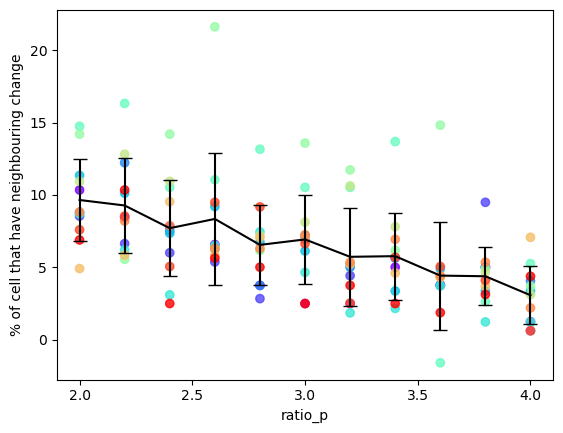

In [13]:
fig, ax = plt.subplots()

ax.scatter(result['ratio_p'], result['pourcentage'],c=result.repeat, cmap="rainbow", alpha=0.8)
ax.set_xlabel('ratio_p')
ax.set_ylabel('% of cell that have neighbouring change')

ax.plot(result.groupby("ratio_p").mean().index, 
        result.groupby("ratio_p").mean()["pourcentage"].to_numpy(), 
        c='black')


ax.bar(result.groupby("ratio_p").mean().index, 
       result.groupby("ratio_p").mean().pourcentage, 
       yerr = result.groupby("ratio_p").std().pourcentage, 
       align='center',
       alpha=0,
       ecolor='black',
       capsize=5)

# _=ax.set_yticks([0, 10,20,30, 40])
_=ax.set_xticks([2,2.5,3.,3.5,4])
ax.set_xlim(1.9, 4.1)
# ax.set_ylim(-0.5, 45)
# fig.set_size_inches((10,10))
# ax.set_aspect('equal')
fig.savefig(os.path.join(SIM_DIR,"lateral_fixe_3d_perimeter_t1_wth_basal.eps"), dpi=150)
fig.savefig(os.path.join(SIM_DIR,"lateral_fixe_3d_perimeter_t1_wth_basal.png"), dpi=150)

(1.9, 4.1)

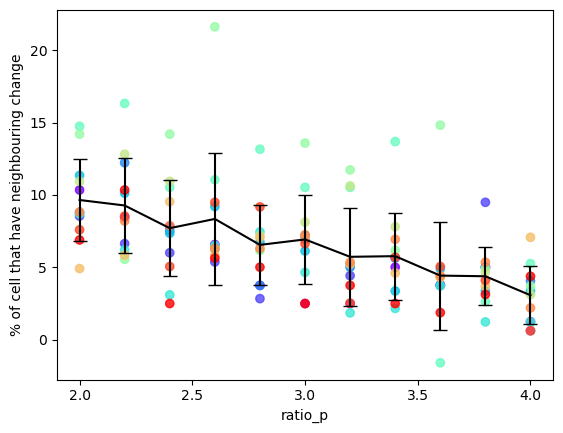

In [14]:
fig, ax = plt.subplots()

ax.scatter(result['ratio_p'], result['pourcentage2'],c=result.repeat, cmap="rainbow", alpha=0.8)
ax.set_xlabel('ratio_p')
ax.set_ylabel('% of cell that have neighbouring change')

ax.plot(result.groupby("ratio_p").mean().index, 
        result.groupby("ratio_p").mean()["pourcentage2"].to_numpy(), 
        c='black')


ax.bar(result.groupby("ratio_p").mean().index, 
       result.groupby("ratio_p").mean().pourcentage2, 
       yerr = result.groupby("ratio_p").std().pourcentage2, 
       align='center',
       alpha=0,
       ecolor='black',
       capsize=5)

# _=ax.set_yticks([0, 10,20,30, 40])
_=ax.set_xticks([2,2.5,3.,3.5,4])
ax.set_xlim(1.9, 4.1)
# ax.set_ylim(-0.5, 45)
# fig.set_size_inches((10,10))
# ax.set_aspect('equal')
# fig.savefig("3d_perimeter_t1.eps", dpi=150)

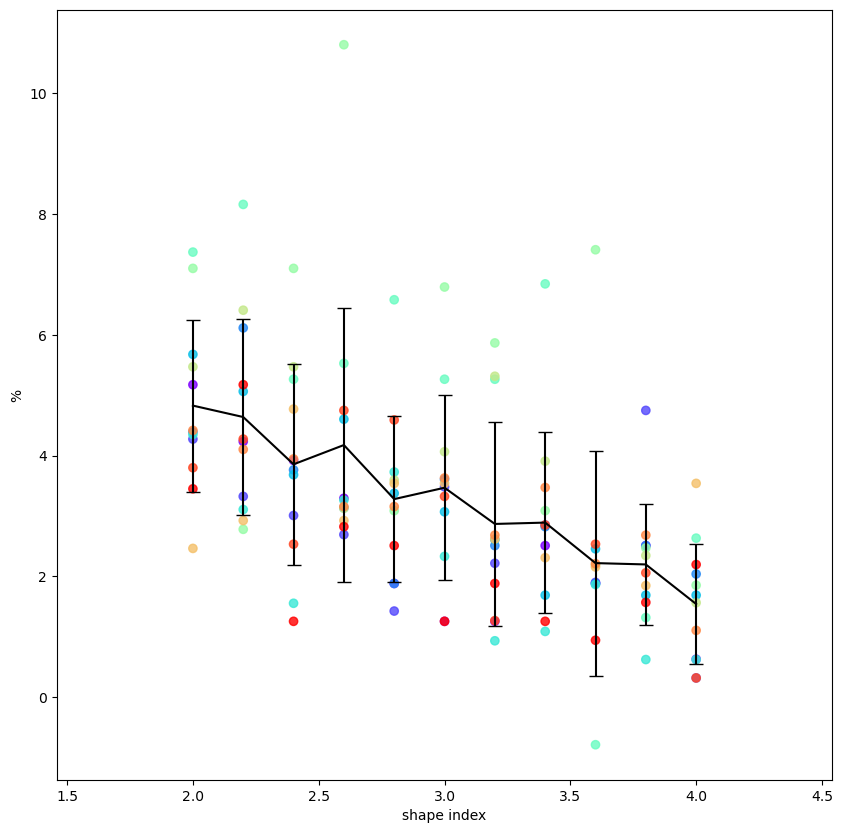

In [15]:
result['pourc_change'] = (result['nb_change']/2)/result['tot_cell']*100
# result.drop("group", axis=1, inplace=True)
fig, ax = plt.subplots()
ax.scatter(result.ratio_p,
           result.pourc_change, 
           c=result.repeat, cmap="rainbow", alpha=0.8)

ax.plot(result[["pourc_change", "ratio_p"]].groupby("ratio_p").mean().index, 
        result[["pourc_change", "ratio_p"]].groupby("ratio_p").mean()["pourc_change"].to_numpy(), 
        c='black')


ax.bar(result.groupby("ratio_p").mean().index, 
       result.groupby("ratio_p").mean().pourc_change, 
       yerr = result.groupby("ratio_p").std().pourc_change, 
       align='center',
       alpha=0,
       ecolor='black',
       capsize=5)

ax.set_xlabel('shape index')
ax.set_ylabel('%')

# _=ax.set_yticks([0, 10,20,30])
# _=ax.set_xticks([0.05,0.1,0.15,0.2])
# ax.set_xlim(0, 0.21)
# ax.set_ylim(-0.01, 30)
fig.set_size_inches((10,10))
# ax.set_aspect('equal')
# fig.savefig("2d_gamma_t1.eps", dpi=150)

/tmp/ipykernel_1764636/722503648.py:10: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-o" (-> linestyle='-'). The keyword argument will take precedence.
  ax.errorbar(result.groupby('ratio_p').mean().index,


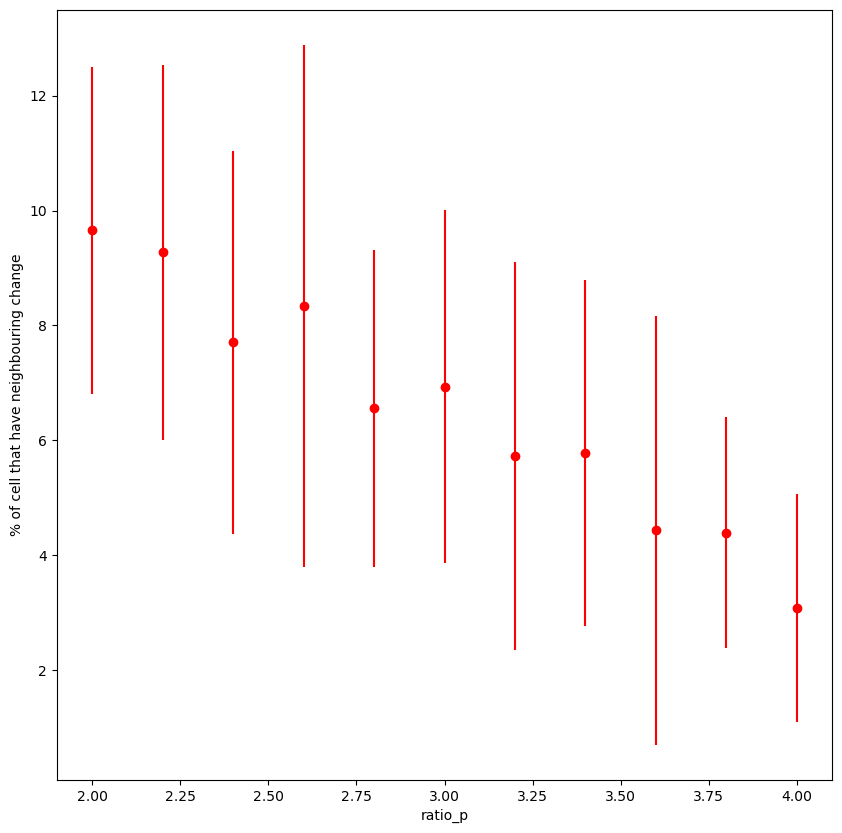

In [16]:
fig, ax = plt.subplots()
# ax.plot(result['gamma'], result['pourcentage'], '.', markersize=10, color='black')
ax.set_xlabel('ratio_p')
ax.set_ylabel('% of cell that have neighbouring change')

ax.plot(result.groupby('ratio_p').mean().index, result.groupby('ratio_p').mean()['pourcentage'], 
        '.',color='red',  markersize=10, label='mean')


ax.errorbar(result.groupby('ratio_p').mean().index,
            result.groupby('ratio_p').mean()['pourcentage'],
            result.groupby('ratio_p').std()['pourcentage'],
            linestyle='None', fmt='-o', color='red')
fig.set_size_inches((10,10))

# fig.savefig(SIM_DIR/'result.eps', dpi=300)

In [17]:
result.to_csv(os.path.join(SIM_DIR, 'result_count.csv'))

# Time plot

In [74]:
nb_changes_tot = []
angle_tot = []
r = 0
g = 0.0

repeat = np.arange(3)
ratios = np.arange(2, 4.2, 0.2)

for r in repeat:
    for ratio in ratios: 

        nb_changes = []
        g=round(ratio, 1)
        sim_save_dir = SIM_DIR/str(r)    

        for i in range(299):
            if os.path.isfile(os.path.join(sim_save_dir/str(g),'monolayer'+str(i)+'.hf5')):
                monolayer_d = load_datasets(os.path.join(sim_save_dir/str(g),'monolayer'+str(i)+'.hf5'))

                monolayer = Monolayer("mono", monolayer_d)
                count = len(np.unique(monolayer.edge_df[(monolayer.edge_df['face'].isin(monolayer.face_df[monolayer.face_df['num_sides']==3].index)) &
                              (monolayer.edge_df['segment']=='lateral') & (monolayer.edge_df['face'].isin(monolayer.face_df[monolayer.face_df['area']>0.01].index))]['cell']))
                nb_changes.append(count/monolayer.Nc*100)

        nb_changes_tot.append(nb_changes)

        tri_face_ids = np.unique(monolayer.edge_df[(monolayer.edge_df['face'].isin(monolayer.face_df[monolayer.face_df['num_sides']==3].index)) &
                          (monolayer.edge_df['segment']=='lateral') & (monolayer.edge_df['face'].isin(monolayer.face_df[monolayer.face_df['area']>0.01].index))]['cell'])

        angle0=[]
        for f in tri_face_ids :
            dx = monolayer.edge_df[(monolayer.edge_df['face']==f) & 
                            (((monolayer.edge_df['sz']>0.4) & (monolayer.edge_df['tz']>0.4)) |
                             ((monolayer.edge_df['sz']<-0.4) & (monolayer.edge_df['tz']<-0.4)))]['dx'].to_numpy()
            dy = monolayer.edge_df[(monolayer.edge_df['face']==f) & 
                            (((monolayer.edge_df['sz']>0.4) & (monolayer.edge_df['tz']>0.4)) |
                             ((monolayer.edge_df['sz']<-0.4) & (monolayer.edge_df['tz']<-0.4)))]['dy'].to_numpy()
            if len(dx)!=0:
                angle0.append(np.arctan2(dy, dx)[0]*180/np.pi)        

        angle_tot.append(angle0)


In [75]:
len(nb_changes_tot)

33

Text(0, 0.5, '% of cell ')

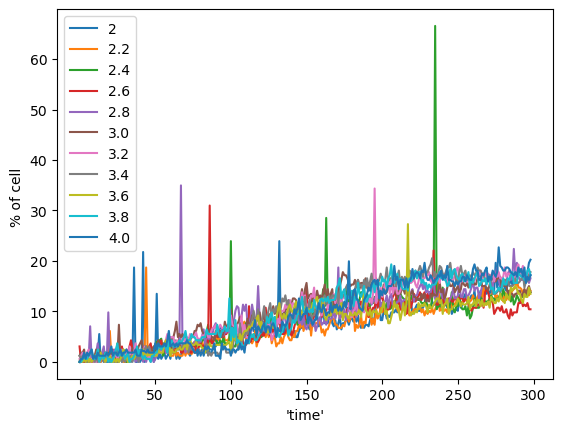

In [76]:
fig, ax = plt.subplots()
i=2
for nb_tot in nb_changes_tot[:11]:
    ax.plot(np.array(nb_tot), label=str(np.round(i,1)))
    i+=0.2
# ax.plot(nb_changes2, label='0.2')
ax.legend()
ax.set_xlabel('\'time\'')
ax.set_ylabel('% of cell ')

# fig.set_size_inches((10,10))

Text(0, 0.5, '% of cell ')

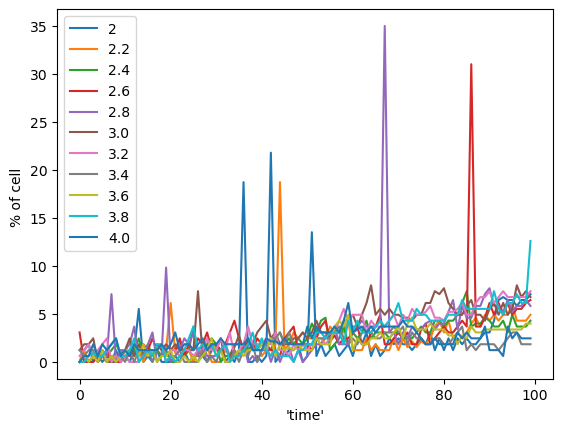

In [77]:
fig, ax = plt.subplots()
i=2
for nb_tot in nb_changes_tot[:11]:
    ax.plot(np.array(nb_tot[:100]), label=str(np.round(i,1)))
    i+=0.2
# ax.plot(nb_changes2, label='0.2')
ax.legend()
ax.set_xlabel('\'time\'')
ax.set_ylabel('% of cell ')

# fig.set_size_inches((10,10))

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


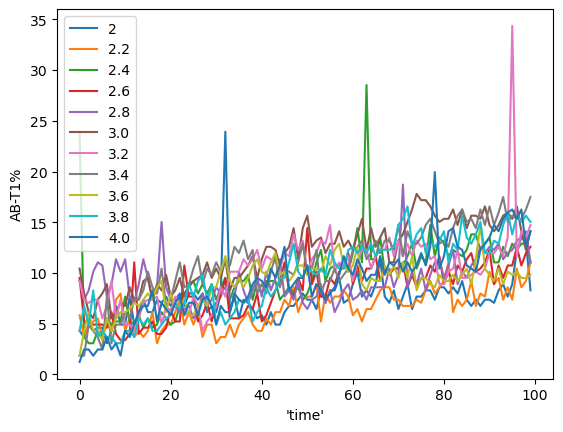

In [78]:
fig, ax = plt.subplots()
i=2
for nb_tot in nb_changes_tot[:11]:
    ax.plot(np.array(nb_tot[100:200]), label=str(np.round(i,1)))
    i+=0.2
# ax.plot(nb_changes2, label='0.2')
ax.legend()
ax.set_xlabel('\'time\'')
ax.set_ylabel('AB-T1%')

# fig.set_size_inches((10,10))
fig.savefig("t1_time_with_forces.png",dpi=300)
fig.savefig("t1_time_with_forces.eps",dpi=300)

(array([ 821.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
        1475.]),
 array([1.5 , 1.75, 2.  , 2.25, 2.5 , 2.75, 3.  , 3.25, 3.5 , 3.75, 4.  ]),
 <BarContainer object of 10 artists>)

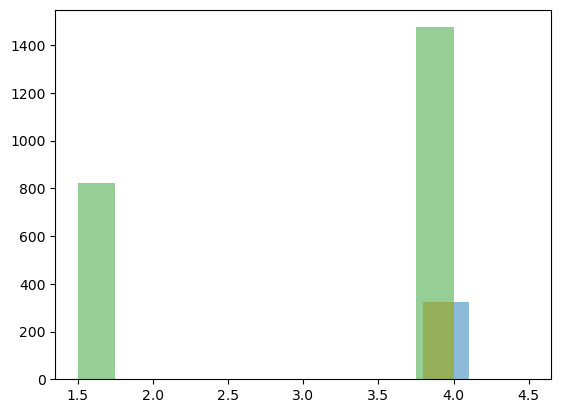

In [46]:
plt.hist(monolayer.face_df[monolayer.face_df["segment"]=="apical"]["prefered_perimeter"]/np.sqrt(monolayer.face_df[monolayer.face_df["segment"]=="apical"]["prefered_area"]), alpha=0.5)
plt.hist(monolayer.face_df[monolayer.face_df["segment"]=="basal"]["prefered_perimeter"]/np.sqrt(monolayer.face_df[monolayer.face_df["segment"]=="basal"]["prefered_area"]), alpha=0.5)
plt.hist(monolayer.face_df[monolayer.face_df["segment"]=="lateral"]["prefered_perimeter"]/np.sqrt(monolayer.face_df[monolayer.face_df["segment"]=="lateral"]["prefered_area"]), alpha=0.5)

In [120]:
len(angle_tot)

33

In [34]:
import numpy as np

def calculate_angle_between_segments(point_a, point_b, point_c, point_d):
    # Define vectors
    vector_ab = np.array([point_b[i] - point_a[i] for i in range(3)])
    vector_cd = np.array([point_d[i] - point_c[i] for i in range(3)])
    
    # Calculate dot product
    dot_product = np.dot(vector_ab, vector_cd)
    
    # Calculate magnitudes
    magnitude_ab = np.linalg.norm(vector_ab)
    magnitude_cd = np.linalg.norm(vector_cd)
    
    # Ensure no division by zero
    if magnitude_ab == 0 or magnitude_cd == 0:
        raise ValueError("One of the segments is of zero length.")
    
    # Calculate cosine of the angle
    cos_theta = dot_product / (magnitude_ab * magnitude_cd)
    
    # Ensure the value is within the valid range for arccos due to numerical errors
    cos_theta = np.clip(cos_theta, -1.0, 1.0)
    
    # Calculate the angle in radians and convert to degrees
    theta = np.arccos(cos_theta)
    angle_degrees = np.degrees(theta)
    
    return angle_degrees


In [41]:
sim_save_dir = SIM_DIR/str(3)   
monolayer_d = load_datasets(os.path.join(sim_save_dir/str(2.0),'monolayer299.hf5'))
mono = Monolayer("mono", monolayer_d)


angles_2 = []
lengths_2 = []
remove_i = []

pos_A = []
pos_B = []
for i in mono.edge_df[(mono.edge_df["segment"]=="lateral") & (mono.edge_df["is_border"]==False)].index:
    
    if (mono.edge_df.loc[i][["srce", "trgt"]].min(),
        mono.edge_df.loc[i][["srce", "trgt"]].max()) not in remove_i:
    
        z_dist = np.abs(mono.vert_df.loc[mono.edge_df.loc[i]["trgt"]]["z"] - mono.vert_df.loc[mono.edge_df.loc[i]["srce"]]["z"])
        if (mono.edge_df.loc[i]["length"]>0.2) and z_dist>0.5:

            A = mono.vert_df.loc[mono.edge_df.loc[i]["trgt"]][list("xyz")]
            B = mono.vert_df.loc[mono.edge_df.loc[i]["srce"]][list("xyz")]
            pos_A.append(A)
            pos_B.append(B)

            remove_i.append((mono.edge_df.loc[i][["srce", "trgt"]].min(),
                             mono.edge_df.loc[i][["srce", "trgt"]].max()))

            C = (0, 0, 0)
            D = (0, 0, 1)
            lengths_2.append(np.linalg.norm(np.array([B[i] - A[i] for i in range(3)])))

            angle = calculate_angle_between_segments(A, B, C, D)
            angles_2.append(angle)
            
            
            
monolayer_d = load_datasets(os.path.join(sim_save_dir/str(4.0),'monolayer299.hf5'))
mono = Monolayer("mono", monolayer_d)


angles_4 = []
lengths_4 = []
remove_i = []

pos_A = []
pos_B = []
z_dists = []
for i in mono.edge_df[(mono.edge_df["segment"]=="lateral") & (mono.edge_df["is_border"]==False)].index:
    
    if (mono.edge_df.loc[i][["srce", "trgt"]].min(),
        mono.edge_df.loc[i][["srce", "trgt"]].max()) not in remove_i:
    
        z_dist = np.abs(mono.vert_df.loc[mono.edge_df.loc[i]["trgt"]]["z"] - mono.vert_df.loc[mono.edge_df.loc[i]["srce"]]["z"])
        z_dists.append(z_dist)
        if (mono.edge_df.loc[i]["length"]>0.2) and z_dist>0.5:
        
            A = mono.vert_df.loc[mono.edge_df.loc[i]["trgt"]][list("xyz")]
            B = mono.vert_df.loc[mono.edge_df.loc[i]["srce"]][list("xyz")]
            pos_A.append(A)
            pos_B.append(B)

            remove_i.append((mono.edge_df.loc[i][["srce", "trgt"]].min(),
                             mono.edge_df.loc[i][["srce", "trgt"]].max()))

            C = (0, 0, 0)
            D = (0, 0, 1)
            lengths_4.append(np.linalg.norm(np.array([B[i] - A[i] for i in range(3)])))

            angle = calculate_angle_between_segments(A, B, C, D)
            angles_4.append(angle)

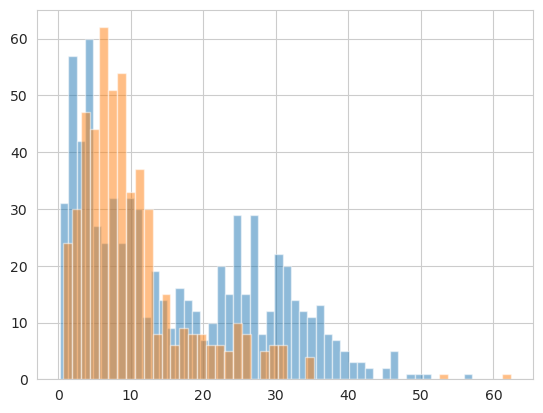

In [42]:
fig, ax = plt.subplots()
# angles_2 = angle_tot[0]
aas_2 = [t+180 if t<0 else t for t in angles_2]
aas_2 = [180-t if t>90 else t for t in aas_2]
# _=ax.hist(angles_2, bins = 50, alpha=0.5)
_=ax.hist(aas_2, bins = 50, alpha=0.5)

# angles_4 = angle_tot[10]
aas_4 = [t+180 if t<0 else t for t in angles_4]
aas_4 = [180-t if t>90 else t for t in aas_4]
_=ax.hist(aas_4, bins = 50, alpha=0.5)

TtestResult(statistic=9.505585522965621, pvalue=9.759461382868714e-21, df=1252.0)


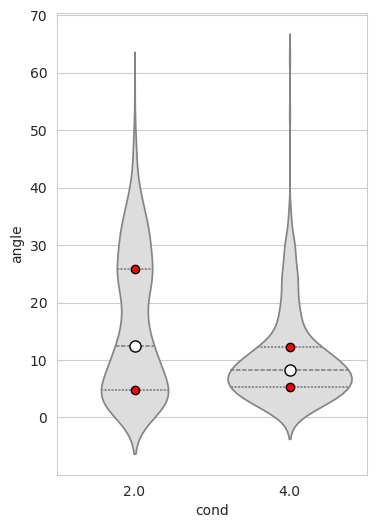

In [43]:
import seaborn as sns

df = pd.DataFrame([np.concatenate([aas_2, aas_4]),
                  np.concatenate([np.repeat(2, len(aas_2)), 
                                  np.repeat(4, len(aas_4))])]).T
df.columns=["angle", "cond"]

sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(4, 6))
sns.violinplot(x="cond", y="angle", data = df,
               color='#DDDDDD', inner="quart"
              )


# sns.stripplot(x='cond', y='angle', data=df, 
#               jitter=True, linewidth=1, )


medians = df.groupby('cond').median().reset_index()
q25 = df.groupby('cond').quantile(0.25).reset_index()
q75 = df.groupby('cond').quantile(0.75).reset_index()

sns.swarmplot(x='cond', y='angle', data=medians, 
              color='white', edgecolor='black', linewidth=1, size=8)

sns.swarmplot(x='cond', y='angle', data=q25, 
              color='red', edgecolor='black', linewidth=1, size=6)

sns.swarmplot(x='cond', y='angle', data=q75, 
              color='red', edgecolor='black', linewidth=1, size=6)

from scipy.stats import ttest_ind
print(ttest_ind(aas_2, aas_4))
fig.savefig(os.path.join(SIM_DIR, "violin_plot_orientation_lateral_edges.png"))
fig.savefig(os.path.join(SIM_DIR, "violin_plot_orientation_lateral_edges.eps"))
# fig.savefig("violin_plot_orientation_lateral_edges.eps")

# Result V3 - tenseur 

In [31]:
from scipy.linalg import eig, inv

result = pd.DataFrame(columns = ['repeat', 'ratio_p', 'T_i', 'eigen'])

repeat = np.arange(12)
ratios = np.arange(2, 4.2, 0.2)

for r in repeat:
    sim_save_dir = SIM_DIR/str(r)   
    for ratio in ratios:
        g=round(ratio, 1)
        dir_ = sim_save_dir/str(g)
        try : 
            monolayer_d = load_datasets(os.path.join(sim_save_dir/str(g),'monolayer299.hf5'))
        except: 
            monolayer_d = load_datasets(os.path.join(sim_save_dir/str(g),'monolayer150.hf5'))
        monolayer = Monolayer("mono", monolayer_d)
        id_new_edges = monolayer.edge_df[(monolayer.edge_df['face'].isin(monolayer.face_df[monolayer.face_df['num_sides']==3].index)) 
                                                 & (monolayer.edge_df['face'].isin(monolayer.face_df[monolayer.face_df['area']>0.01].index))
                                                 &   (((monolayer.edge_df['sz']>0.4) & (monolayer.edge_df['tz']>0.4)) |
                                                     ((monolayer.edge_df['sz']<-0.4) & (monolayer.edge_df['tz']<-0.4))) 
                                                 ].index

        # Pour chaque edge apical (ou basal) d'une face triangulaire
        mm_apical = []
        mm_basal = []
        for id_ in id_new_edges:
            # Recuperation des faces voisines
            id_face_neighbours = monolayer.get_neighbors(monolayer.edge_df.loc[id_]['face'], elem='face')
            neighbouring_face = monolayer.face_df.loc[list(id_face_neighbours)]

            # recuperation des faces uniquement apicale(ou basale)
            faces = []
            segment = ""
            for nf in neighbouring_face.index : 
                if ((monolayer.edge_df[monolayer.edge_df['face']==nf]['sz'] >  0.2).all() & (monolayer.edge_df[monolayer.edge_df['face']==nf]['tz'] >  0.2).all()):
                    if monolayer.face_df.loc[nf]['opposite']==-1:
                        faces.append(nf)
                        segment = "apical"
                elif ((monolayer.edge_df[monolayer.edge_df['face']==nf]['sz'] < -0.2).all() & (monolayer.edge_df[monolayer.edge_df['face']==nf]['tz'] < -0.2).all()):
                    if monolayer.face_df.loc[nf]['opposite']==-1:
                        faces.append(nf)
                        segment = 'basal'

            if len(faces)==2:
                # Creation de la matrice m
                X, Y, Z = monolayer.face_df.loc[faces[0]][list("xyz")] - monolayer.face_df.loc[faces[1]][list("xyz")]


                m = np.array([[X**2,  X*Y , X*Z ],
                              [Y*X  , Y**2, Y*Z ],
                              [Z*X  , Z*Y , Z**2]
                            ])
                m = m[:2,:2]
                if segment == 'apical':
                    mm_apical.append(m)
                elif segment == 'basal':
                    mm_basal.append(m)
                    
        mm_apical = np.array(mm_apical)
        mm_basal  = np.array(mm_basal)
        T_i = mm_apical.shape[0] * mm_apical.mean(axis=0) - mm_basal.shape[0] * mm_basal.mean(axis=0)
        
        
        #Eigen value calculation
        # Diagonalisation
        vals, vecs = eig(T_i)
        diag_m = np.zeros((2, 2))
        for i in range(0,len(vals)):
            diag_m[i,i] = vals[i].real
       
        
        result = pd.concat([result, pd.DataFrame({'repeat':r,
                                                  'ratio_p':g, 
                                                  'T_i':[T_i],
                                                  'eigen':[diag_m]})],
                          ignore_index=True)

In [32]:
result


,repeat,ratio_p,T_i,eigen
0,0,2.0,"[[-3.786302058290337, 0.13611402987184573], [0...","[[-3.7891023800411725, 0.0], [0.0, 2.829733803..."
1,0,2.2,"[[-3.5189551543595883, 3.724596327287178], [3....","[[-5.851090190708081, 0.0], [0.0, 2.4295073424..."
2,0,2.4,"[[3.9740646667588226, 4.661196703910398], [4.6...","[[1.685125956086857, 0.0], [0.0, 13.4661295312..."
3,0,2.6,"[[3.03476261518675, -2.002013896142609], [-2.0...","[[2.5494178866361086, 0.0], [0.0, 11.292933363..."
4,0,2.8,"[[-3.3898290044330306, -2.968038334974671], [-...","[[-5.695771060279712, 0.0], [0.0, 0.4304107693..."
...,...,...,...,...
127,11,3.2,"[[-6.8134327216966195, 2.3349697434592187], [2...","[[-7.4078269519756645, 0.0], [0.0, 2.359071695..."
128,11,3.4,"[[-5.218973506153916, 2.4209065753287424], [2....","[[-5.980566376164274, 0.0], [0.0, 2.4764617811..."
129,11,3.6,"[[2.607288034877164, -1.020538747866469], [-1....","[[3.008082482484496, 0.0], [0.0, 0.00870079866..."
130,11,3.8,"[[12.79084231272481, -1.7170619289849178], [-1...","[[12.359006797224168, 0.0], [0.0, 19.618214222..."


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


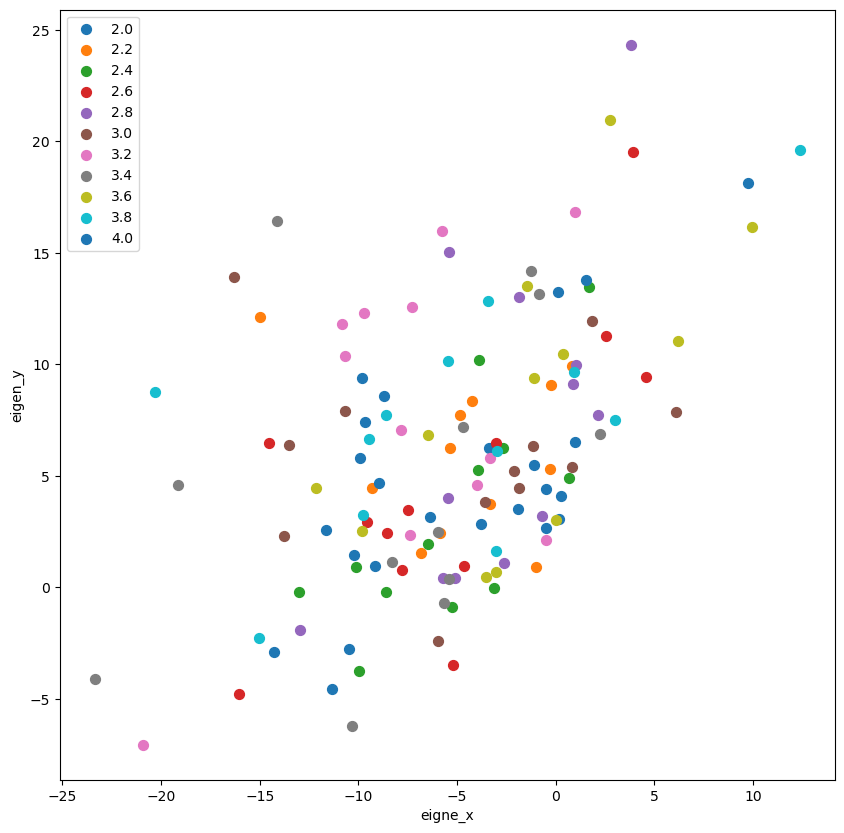

In [33]:
# Plot 
eigen_x = []
eigen_y = []
for i in range(result.shape[0]):
    eigen_x.append(np.min((result.iloc[i]['eigen'][0,0], result.iloc[i]['eigen'][1,1])))
    eigen_y.append(np.max((result.iloc[i]['eigen'][0,0], result.iloc[i]['eigen'][1,1])))
#     eigen_x.append(result.iloc[i]['eigen'][0,0])
#     eigen_y.append(result.iloc[i]['eigen'][1,1])

fig, ax = plt.subplots()
fig.set_size_inches((10,10))
i=0
for g in ratios:
    ax.scatter(eigen_x[i::len(ratios)], eigen_y[i::len(ratios)], s=50, label=round(g, 1))
    i+=1
ax.set_xlabel('eigne_x')
ax.set_ylabel('eigen_y')
ax.legend()
fig.savefig(os.path.join(SIM_DIR,"eigens.eps"), dpi=150)
fig.savefig(os.path.join(SIM_DIR,"eigens.png"), dpi=150)

Text(0, 0.5, 'eigen_x')

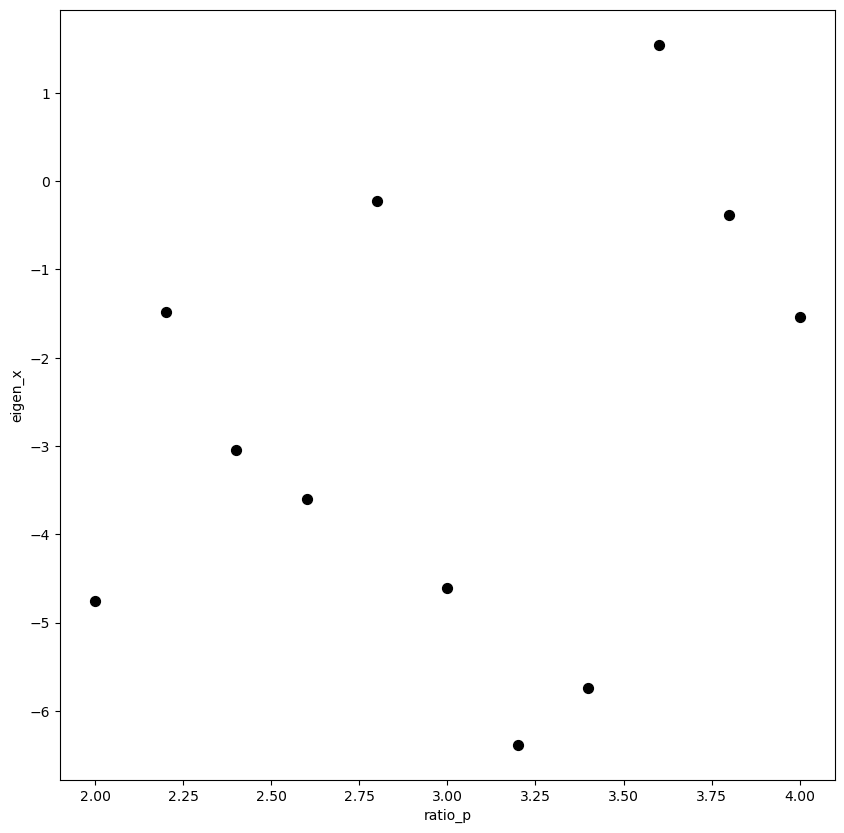

In [34]:
# Matrice T sommée sur tous les réplicats
result_sum = result.groupby("ratio_p").sum()[['T_i']]/10
result_sum['eigen'] = np.repeat("", result_sum.shape[0])

# Recalcul des valeurs propres sur la somme des T_i (=> Lambda_X(<T_i>))
for id_, val in result_sum.iterrows():
    vals, vecs = eig(val['T_i'])
    diag_m = np.zeros((2,2))
    for i in range(0,len(vals)):
        diag_m[i,i] = vals[i].real
    result_sum.loc[id_]['eigen'] = diag_m

    

# plot
fig, ax = plt.subplots()
fig.set_size_inches((10,10))
for id_, val in result_sum.iterrows():
    ax.scatter(id_, np.min((val['eigen'][0,0], val['eigen'][1,1])), color='black', s=50)

ax.set_xlabel('ratio_p')
ax.set_ylabel('eigen_x')


# fig.savefig(SIM_DIR/'gamma_eigenX.png', dpi=150)

In [35]:
# Bootstrap pour calculer l'intervalle de confiance
eigen_x = []
eigen_y = []
for i in range(result.shape[0]):
    eigen_x.append(np.min((result.iloc[i]['eigen'][0,0], result.iloc[i]['eigen'][1,1])))

from scipy.stats import bootstrap

result_bootstrap = pd.DataFrame(columns= ['ratio_p', 'ci_l', 'ci_h', 'std_error'])
i=0
for g in ratios:
    res = bootstrap((eigen_x[i::11],), 
                    np.std, 
                    confidence_level=0.95, 
                    random_state=1,
                    method="percentile", 
                   )
    
    result_bootstrap = pd.concat([result_bootstrap, 
                                  pd.DataFrame.from_dict({'ratio_p':round(g,2), 
                                                'ci_l':res.confidence_interval[0],
                                                'ci_h':res.confidence_interval[1],
                                                'std_error':res.standard_error,
                                               }, orient='index').T],
                          ignore_index=True)
    i+=1

<Axes: xlabel='ratio_p'>

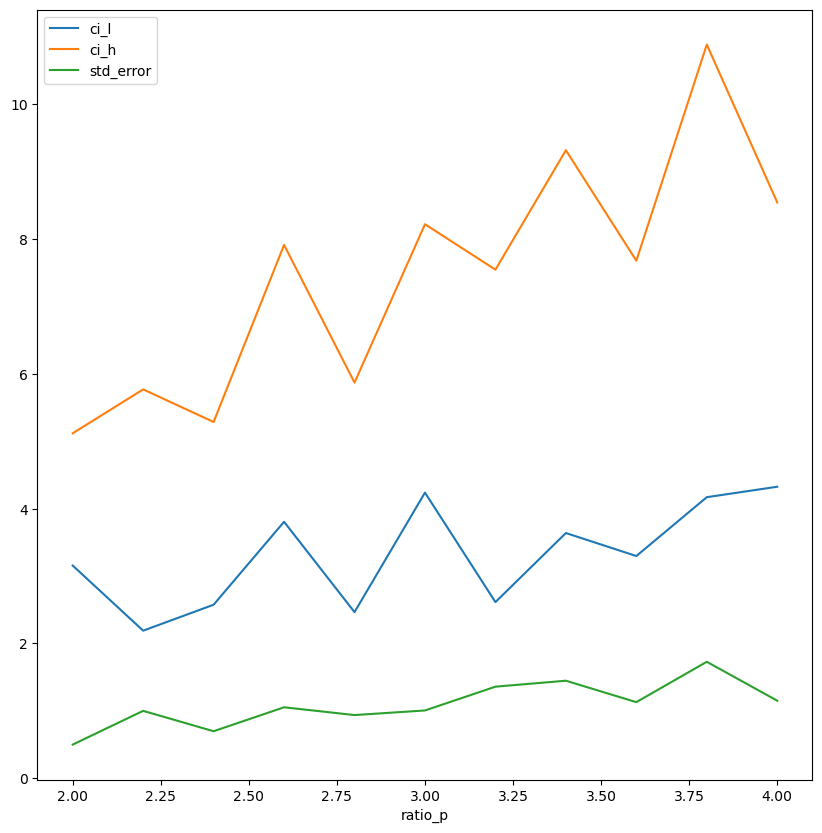

In [36]:
fig, ax = plt.subplots()
fig.set_size_inches((10,10))
result_bootstrap.plot('ratio_p', ['ci_l', 'ci_h', 'std_error'], ax=ax)
# fig.savefig(SIM_DIR/'result_bootstrap.png', dpi=150)

In [43]:
len(eigen_x)/11

11.0

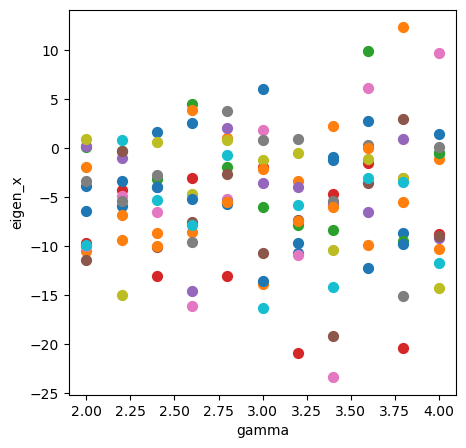

In [37]:
fig, ax = plt.subplots()
i=0
for r in repeat:
    st = i*11
    ax.scatter(ratios, eigen_x[st:st+11:],s=50)
    i+=1
ax.set_ylabel('eigen_x')
ax.set_xlabel('gamma')
fig.set_size_inches((5,5))

ValueError: x and y must be the same size

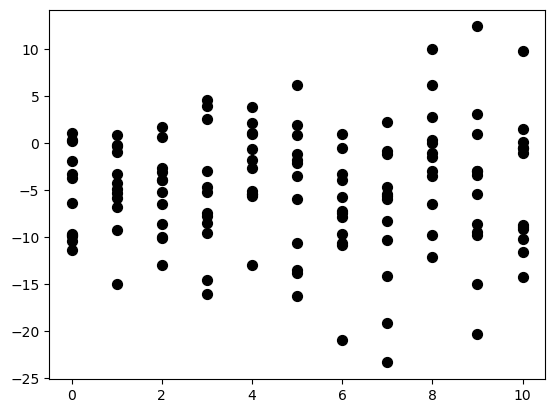

In [44]:
fig, ax = plt.subplots()
i=0
for g in repeat:
    ax.scatter(np.repeat(g,12), eigen_x[i::11], s=50, color='black')
    i+=1
ax.set_ylabel('eigen_x')
ax.set_xlabel('G')
fig.set_size_inches((7,7))
# fig.savefig(SIM_DIR/'gamma_eigenX_replicats.png', dpi=150)


# fig, ax = plt.subplots()
# i=0
# for g in gammas:
#     ax.plot(np.repeat(g,10), eigen_y[i::21], '.', color='black')
#     i+=1
# ax.set_xlabel('gamma')
# ax.set_ylabel('eigen_y')

In [45]:
eigen_x = []
eigen_y = []
for i in range(result.shape[0]):
    eigen_x.append(np.min((result.iloc[i]['eigen'][0,0], result.iloc[i]['eigen'][1,1])))
    eigen_y.append(np.max((result.iloc[i]['eigen'][0,0], result.iloc[i]['eigen'][1,1])))
    
result['Lambda_x'] = eigen_x
result['Lambda_y'] = eigen_y
result

,repeat,ratio_p,T_i,eigen,Lambda_x,Lambda_y
0,0,2.0,"[[-3.786302058290337, 0.13611402987184573], [0...","[[-3.7891023800411725, 0.0], [0.0, 2.829733803...",-3.789102,2.829734
1,0,2.2,"[[-3.5189551543595883, 3.724596327287178], [3....","[[-5.851090190708081, 0.0], [0.0, 2.4295073424...",-5.851090,2.429507
2,0,2.4,"[[3.9740646667588226, 4.661196703910398], [4.6...","[[1.685125956086857, 0.0], [0.0, 13.4661295312...",1.685126,13.466130
3,0,2.6,"[[3.03476261518675, -2.002013896142609], [-2.0...","[[2.5494178866361086, 0.0], [0.0, 11.292933363...",2.549418,11.292933
4,0,2.8,"[[-3.3898290044330306, -2.968038334974671], [-...","[[-5.695771060279712, 0.0], [0.0, 0.4304107693...",-5.695771,0.430411
...,...,...,...,...,...,...
127,11,3.2,"[[-6.8134327216966195, 2.3349697434592187], [2...","[[-7.4078269519756645, 0.0], [0.0, 2.359071695...",-7.407827,2.359072
128,11,3.4,"[[-5.218973506153916, 2.4209065753287424], [2....","[[-5.980566376164274, 0.0], [0.0, 2.4764617811...",-5.980566,2.476462
129,11,3.6,"[[2.607288034877164, -1.020538747866469], [-1....","[[3.008082482484496, 0.0], [0.0, 0.00870079866...",0.008701,3.008082
130,11,3.8,"[[12.79084231272481, -1.7170619289849178], [-1...","[[12.359006797224168, 0.0], [0.0, 19.618214222...",12.359007,19.618214


In [46]:

eigen_x = []
eigen_y = []
for i in range(result_sum.shape[0]):
    eigen_x.append(np.min((result_sum.iloc[i]['eigen'][0,0], result_sum.iloc[i]['eigen'][1,1])))
    eigen_y.append(np.max((result_sum.iloc[i]['eigen'][0,0], result_sum.iloc[i]['eigen'][1,1])))
    
result_sum['Lambda_x'] = eigen_x
result_sum['Lambda_y'] = eigen_y
result_sum

,T_i,eigen,Lambda_x,Lambda_y
ratio_p,,,,
2.0,"[[-4.634643897004967, 0.9220667606238555], [0....","[[-4.750504195236665, 0.0], [0.0, 2.7035653431...",-4.750504,2.703565
2.2,"[[-1.4666195854200925, -0.31398575304693777], ...","[[-1.488064036031545, 0.0], [0.0, 3.1307028129...",-1.488064,3.130703
2.4,"[[-2.315328730603923, -1.3957096291741515], [-...","[[-3.0438795799076335, 0.0], [0.0, 0.358479653...",-3.043880,0.358480
2.6,"[[-3.5097096627404163, -0.7449592219072574], [...","[[-3.600959706813319, 0.0], [0.0, 2.5720873154...",-3.600960,2.572087
2.8,"[[-0.21822881959565005, -0.16968877079165345],...","[[-0.2231210441148912, 0.0], [0.0, 5.667494294...",-0.223121,5.667494
3.0,"[[-3.691165092692175, 2.9698190590615274], [2....","[[-4.6104076865511, 0.0], [0.0, 5.903500453145...",-4.610408,5.903500
3.2,"[[-6.186005294588359, 1.612784013921291], [1.6...","[[-6.381311216949602, 0.0], [0.0, 7.1319332712...",-6.381311,7.131933
3.4,"[[-5.201930058775888, -1.9122064343954612], [-...","[[-5.73918662193843, 0.0], [0.0, 1.60400531448...",-5.739187,1.604005
3.6,"[[1.7150819392769834, -0.9127623226969577], [-...","[[1.5441882076441686, 0.0], [0.0, 6.5902464627...",1.544188,6.590246


In [47]:
result.to_csv(SIM_DIR/"result_ti.csv")
result_sum.to_csv(SIM_DIR/"result_t_sum.csv")
result_bootstrap.to_csv(SIM_DIR/"result_bootstrap.csv")

In [48]:
#result from first analysis
result = pd.read_csv(os.path.join(SIM_DIR, 'result_count.csv'))
result_sum = pd.read_csv(SIM_DIR/"result_ti.csv")
result_final = result.copy(deep=True)
result_final['P'] = ((result_sum['Lambda_y']-result_sum['Lambda_x'])/result_final['tot_cell']*100).to_numpy()
result_final.groupby("ratio_p").mean()

,Unnamed: 0.1,Unnamed: 0,repeat,nb_change,tot_cell,pourcentage,pourcentage2,pourc_change,P
ratio_p,,,,,,,,,
2.0,60.5,60.5,5.5,27.416667,295.916667,9.652596,9.652596,4.826298,3.384471
2.2,61.5,61.5,5.5,27.166667,295.916667,9.274177,9.274177,4.637089,3.800166
2.4,62.5,62.5,5.5,21.666667,295.916667,7.708174,7.708174,3.854087,3.082212
2.6,63.5,63.5,5.5,22.666667,295.916667,8.346315,8.346315,4.173158,3.643216
2.8,64.5,64.5,5.5,18.750000,295.916667,6.555891,6.555891,3.277945,3.297295
3.0,65.5,65.5,5.5,19.250000,295.916667,6.932555,6.932555,3.466278,4.078788
3.2,66.5,66.5,5.5,15.666667,295.916667,5.733219,5.733219,2.866609,5.683532
3.4,67.5,67.5,5.5,16.166667,295.916667,5.777641,5.777641,2.888821,4.884009
3.6,68.5,68.5,5.5,12.416667,295.916667,4.436233,4.436233,2.218116,3.263707


In [49]:
result_sum.shape

(132, 7)

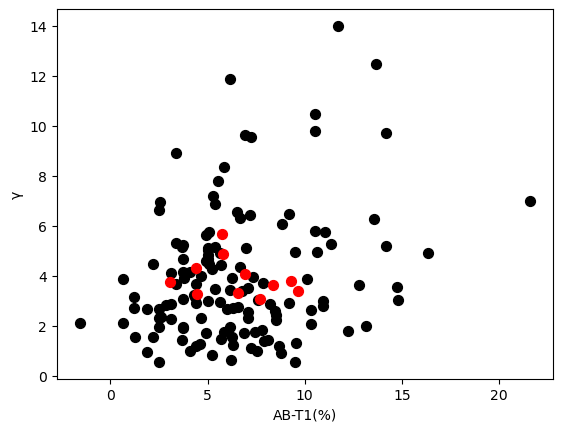

In [50]:
fig, ax = plt.subplots()
ax.scatter(result_final['pourcentage'], result_final['P'],s=50, color='black')
ax.scatter(result_final.groupby("ratio_p").mean()['pourcentage'], result_final.groupby("ratio_p").mean()['P'],s=50, color='red')
ax.set_xlabel("AB-T1(%)")
ax.set_ylabel("γ")

fig.savefig(os.path.join(SIM_DIR, "gamma_vs_abt1.png"))
fig.savefig(os.path.join(SIM_DIR, "gamma_vs_abt1.eps"))

In [51]:
group_pourcent = result_final.groupby('ratio_p').mean()['pourcentage']
result_final['trace'] = (result_sum['Lambda_y']+result_sum['Lambda_x']).to_numpy()
result_final

,Unnamed: 0.1,Unnamed: 0,repeat,ratio_p,nb_change,tot_cell,pourcentage,pourcentage2,pourc_change,P,trace
0,0,0,0,2.0,33,319,10.344828,10.344828,5.172414,2.074870,-0.959369
1,1,1,0,2.2,27,319,8.463950,8.463950,4.231975,2.595799,-3.421583
2,2,2,0,2.4,25,319,7.836991,7.836991,3.918495,3.693105,15.151255
3,3,3,0,2.6,21,319,6.583072,6.583072,3.291536,2.740914,13.842351
4,4,4,0,2.8,12,319,3.761755,3.761755,1.880878,1.920433,-5.265360
...,...,...,...,...,...,...,...,...,...,...,...
127,127,127,11,3.2,12,319,3.761755,3.761755,1.880878,3.061724,-5.048755
128,128,128,11,3.4,8,319,2.507837,2.507837,1.253918,2.651106,-3.504105
129,129,129,11,3.6,6,319,1.880878,1.880878,0.940439,0.940245,3.016783
130,130,130,11,3.8,10,319,3.134796,3.134796,1.567398,2.275614,31.977221


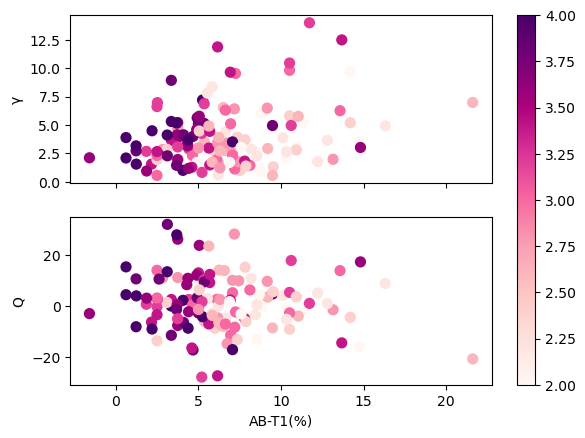

In [52]:
fig, axes = plt.subplots(nrows=2, sharex=True)
ax = axes[0]
ax.scatter(result_final['pourcentage'], result_final['P'],s=50, c=result_final['ratio_p'], cmap="RdPu")


ax.set_ylabel("γ")

ax = axes[1]
im = ax.scatter(result_final['pourcentage'], result_final['trace'],s=50,c=result_final['ratio_p'], cmap="RdPu")
# ax.scatter(group_pourcent, 
#            result_final.groupby('ratio_p').mean()['trace'],s=50, color='red')
ax.set_xlabel("AB-T1(%)")
ax.set_ylabel("Q")

fig.colorbar(im, ax= axes,  orientation='vertical', fraction=.1)
fig.savefig(os.path.join(SIM_DIR, "tensor_vs_abt1.png"))
fig.savefig(os.path.join(SIM_DIR, "tensor_vs_abt1.eps"))

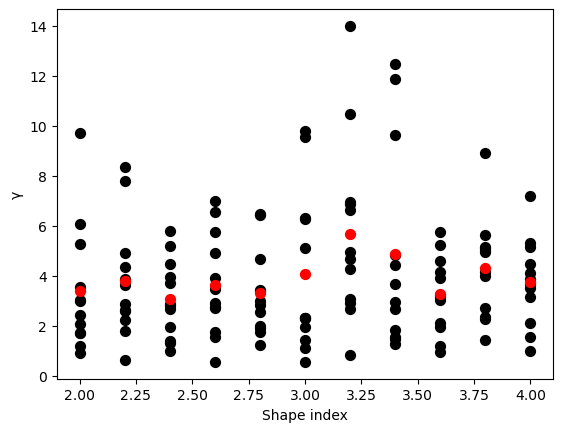

In [53]:
fig, ax = plt.subplots()
ax.scatter(result_final['ratio_p'], result_final['P'],s=50, color='black')
ax.scatter(result_final.groupby("ratio_p").mean().index, result_final.groupby("ratio_p").mean()['P'],s=50, color='red')
ax.set_xlabel("Shape index")
ax.set_ylabel("γ")
fig.savefig(os.path.join(SIM_DIR, "gamma_shapeindex.png"))
fig.savefig(os.path.join(SIM_DIR, "gamma_shapeindex.eps"))

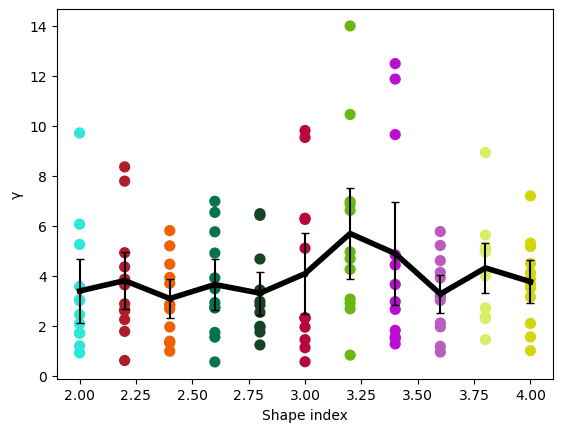

In [54]:
fig, ax = plt.subplots()

import random
get_colors = lambda n: ["#%06x" % random.randint(0, 0xFFFFFF) for _ in range(n)]
color_list = get_colors(100)

cc = []
for rp in (result_final["ratio_p"]*10).to_numpy():
    cc.append(color_list[int(rp)])


ax.scatter(result_final['ratio_p'], result_final['P'], s=50, color=cc)
ax.plot(result_final.groupby("ratio_p").mean().index, result_final.groupby("ratio_p").mean()['P'], 
        linewidth=4, color='black')

yerr = [result_final.groupby("ratio_p").std()["P"]/2,
        result_final.groupby("ratio_p").std()["P"]/2] 

ax.errorbar(result_final.groupby("ratio_p").mean().index, 
            result_final.groupby("ratio_p").mean()['P'],  
            yerr=yerr, capsize=3, fmt="k.", ecolor = "black")

ax.set_xlabel("Shape index")
ax.set_ylabel("γ")
ax.grid(False)
fig.savefig(os.path.join(SIM_DIR, "gamma_shapeindex2.png"))
fig.savefig(os.path.join(SIM_DIR, "gamma_shapeindex2.eps"))

In [61]:
result_final[result_final["ratio_p"]==3.2]

,Unnamed: 0,repeat,ratio_p,nb_change,tot_cell,pourcentage,P,shape_index_lateral
182,182,0,3.2,50,326,15.337423,6.913530,3.5
193,193,1,3.2,49,320,15.312500,8.488125,3.5
204,204,2,3.2,24,97,24.742268,9.240349,3.5
215,215,3,3.2,36,224,16.071429,5.876496,3.5
226,226,4,3.2,47,318,14.779874,5.566822,3.5
237,237,5,3.2,36,324,11.111111,8.813381,3.5
248,248,6,3.2,43,320,13.437500,12.418268,3.5
259,259,7,3.2,39,323,12.074303,13.744923,3.5
270,270,8,3.2,38,326,11.656442,8.643671,3.5
281,281,9,3.2,47,320,14.687500,5.506159,3.5


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


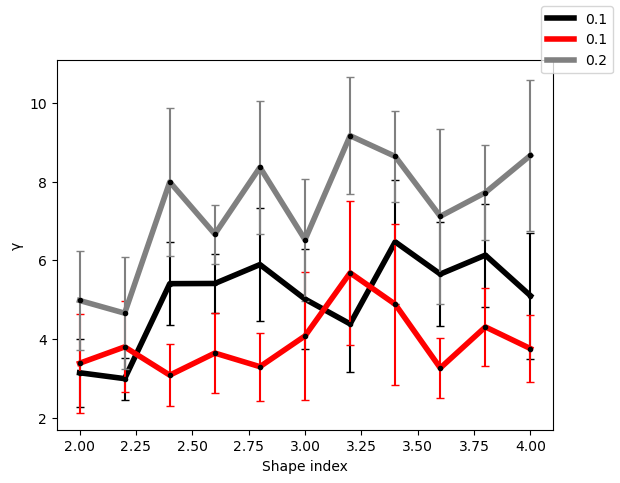

In [59]:
fig, ax = plt.subplots()

result_final = pd.read_csv("/mnt/sda1/Sophie/1-CellPacking/0-Simulations-to-sort/result_3_5_G_0_1.csv")
ax.plot(result_final.groupby("ratio_p").mean().index, result_final.groupby("ratio_p").mean()['P'], 
        linewidth=4, color='black', label="0.1")

yerr = [result_final.groupby("ratio_p").std()["P"]/2,
        result_final.groupby("ratio_p").std()["P"]/2] 

ax.errorbar(result_final.groupby("ratio_p").mean().index, 
            result_final.groupby("ratio_p").mean()['P'],  
            yerr=yerr, capsize=3, fmt="k.", ecolor = "black")

ax.set_xlabel("Shape index")
ax.set_ylabel("γ")
ax.grid(False)



result_final = pd.read_csv("/mnt/sda1/Sophie/1-CellPacking/0-Simulations-to-sort/result_3_5_G_0_05.csv")
ax.plot(result_final.groupby("ratio_p").mean().index, result_final.groupby("ratio_p").mean()['P'], 
        linewidth=4, color='red', label="0.1")

yerr = [result_final.groupby("ratio_p").std()["P"]/2,
        result_final.groupby("ratio_p").std()["P"]/2] 

ax.errorbar(result_final.groupby("ratio_p").mean().index, 
            result_final.groupby("ratio_p").mean()['P'],  
            yerr=yerr, capsize=3, fmt="k.", ecolor = "red")

ax.set_xlabel("Shape index")
ax.set_ylabel("γ")
ax.grid(False)



result_final = pd.read_csv("/mnt/sda1/Sophie/1-CellPacking/0-Simulations-to-sort/result_all.csv")
result_final = result_final[result_final["shape_index_lateral"]==3.5]

ax.plot(result_final.groupby("ratio_p").mean().index, result_final.groupby("ratio_p").mean()['P'], 
        linewidth=4, color='grey', label="0.2")

yerr = [result_final.groupby("ratio_p").std()["P"]/2,
        result_final.groupby("ratio_p").std()["P"]/2] 

ax.errorbar(result_final.groupby("ratio_p").mean().index, 
            result_final.groupby("ratio_p").mean()['P'],  
            yerr=yerr, capsize=3, fmt="k.", ecolor = "grey")

fig.legend()
fig.savefig(os.path.join(SIM_DIR, "gamma_G.png"))
fig.savefig(os.path.join(SIM_DIR, "gamma_G.eps"))

In [55]:
paths = [
        "/mnt/sda1/Sophie/1-CellPacking/0-Simulations-to-sort/20250320_3D_QS_without_HI_PerimeterImpactVolume_lateralfixe_3_5_G005/", 
        ]

shi = [3.5]

res_dataframe = []

i=0
for sdir in paths : 
    result = pd.read_csv(os.path.join(sdir, 'result_count.csv'))
    result_sum = pd.read_csv(os.path.join(sdir, "result_ti.csv"))
    result_final = result.copy(deep=True)
    result_final['P'] = ((result_sum['Lambda_y']-result_sum['Lambda_x'])/result_final['tot_cell']*100).to_numpy()
    result_final.drop(['Unnamed: 0.1', 'Unnamed: 0',"pourcentage2", "pourc_change"], axis=1, inplace=True	)
    result_final["shape_index_lateral"] = shi[i]

    if i ==0 : 
        res_dataframe = result_final.copy(deep=True)
    else:
        res_dataframe = pd.concat([res_dataframe, result_final])
    i+=1
res_dataframe.reset_index(inplace=True, drop=True)
res_dataframe.to_csv("/mnt/sda1/Sophie/1-CellPacking/0-Simulations-to-sort/result_3_5_G_0_05.csv")

## 3D view

In [166]:
SIM_DIR = Path('/mnt/sda1/Sophie/1-CellPacking/0-Simulations-to-sort/20250317_3D_QS_without_HI_PerimeterImpactVolume_lateralfixe/')
sim_save_dir = SIM_DIR
try:
    os.mkdir(sim_save_dir)
except FileExistsError:
    pass

In [183]:
from CellPacking.plot import sheet_view as view3d
from tyssue.io.meshes import save_mesh

monolayer_d = load_datasets(os.path.join(sim_save_dir/str(1)/str(2.0),'monolayer299.hf5'))
monolayer = Monolayer("mono", monolayer_d)
mono = Monolayer("mono", monolayer_d)

save_mesh("mono_2.0.ply", mono)

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

In [184]:
sheet = monolayer.get_sub_sheet('apical')
save_mesh("mono_2.0_apical.ply", sheet)

sheet = monolayer.get_sub_sheet('basal')
save_mesh("mono_2.0_basal.ply", sheet)


Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

In [178]:
def segment_index(mono, column, segment, element):
    df = getattr(mono, "{}_df".format(element))
    return df[df[column] == segment].index

def get_sub_mono(mono, segment):
    """Returns a :class:`Sheet` object of the corresponding
    segment

    Parameters
    ----------
    segment: str, the corresponding segment, wether 'apical' or 'basal'

    """
    datasets = {
        element: mono.datasets[element].loc[segment_index(mono, "half_cut", segment, element)]
        for element in ["cell", "edge", "face", "vert"]
    }
    specs = {k: mono.specs[k] for k in ["face", "edge", "vert", "settings"]}
    return Monolayer(mono.identifier + str(segment), datasets, specs)



monolayer.cell_df["half_cut"] = 0
monolayer.edge_df["half_cut"] = 0
monolayer.face_df["half_cut"] = 0
monolayer.vert_df["half_cut"] = 0

half_cell = monolayer.cell_df[monolayer.cell_df['y']>0].index
monolayer.cell_df.loc[half_cell, "half_cut"] = 1
monolayer.edge_df.loc[monolayer.edge_df[monolayer.edge_df["cell"].isin(half_cell)].index, "half_cut"] = 1
monolayer.face_df.loc[monolayer.edge_df[monolayer.edge_df["cell"].isin(half_cell)]["face"], "half_cut"] = 1
monolayer.vert_df.loc[monolayer.edge_df[monolayer.edge_df["cell"].isin(half_cell)]["srce"], "half_cut"] = 1
monolayer.vert_df.loc[monolayer.edge_df[monolayer.edge_df["cell"].isin(half_cell)]["trgt"], "half_cut"] = 1

save_mesh("mono_2.0_half.ply", get_sub_mono(monolayer, 1))


Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

In [179]:
import ipyvolume as ipv
from tyssue import config
from tyssue.draw.ipv_draw import sheet_view as sheet_view_3d

color='white'
ipv.clear()
draw_spec = config.draw.sheet_spec()
draw_spec['face']['visible'] = True
draw_spec['face']['color'] = color

fig, meshes = sheet_view_3d(mono, **draw_spec)
fig = ipv.gcf()

fig.anglex = 1.0
fig.angley = 0.2
fig.anglez = 0.1

ipv.show()

Container(figure=Figure(box_center=[0.5, 0.5, 0.5], box_size=[1.0, 1.0, 1.0], camera=PerspectiveCamera(fov=45.…

In [180]:
from tyssue.io.meshes import save_mesh


#extract one cell
for cell_id in mono.cell_df.index:
# cell_id = 12
    datasets = {}

    datasets["cell"] = mono.cell_df[mono.cell_df["id"]==cell_id].copy()
    datasets["edge"] = mono.edge_df[mono.edge_df["cell"]==cell_id].copy()
    datasets["face"] = mono.face_df.loc[np.unique(mono.edge_df[mono.edge_df["cell"]==cell_id]["face"])].copy()
    datasets["vert"] = mono.vert_df.loc[mono.edge_df[mono.edge_df["cell"]==cell_id]["srce"].unique()].copy()

    subsheet = Monolayer("subsheet", datasets,)
    subsheet.reset_index()
    subsheet.reset_topo()


    save_mesh("2.0/"+str(cell_id)+".ply", subsheet)

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.

Warning: PLY doesn't support 64-bit integers. Casting down to 32-bit.